# 0- Updating and Importing the Needed Packages

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import logging
logging.getLogger().setLevel(logging.WARNING)
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
from scipy.stats import skew, kurtosis, chi2_contingency, boxcox
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.neighbors import LocalOutlierFactor
import itertools
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay,  roc_auc_score, roc_curve, precision_recall_curve, make_scorer
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from pytorch_tabnet.tab_model import TabNetClassifier
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from sklearn.base import BaseEstimator, ClassifierMixin
import torch
from math import pi

# 1- Loading the Data and Early Data Inspection

In [2]:
# Load the dataset
data = pd.read_csv('1-12_3.csv')
data = data.drop(columns=['id'])

In [3]:
data.shape

(100000, 21)

In [4]:
data.head()

,gender,age,tenure_days,handset_technology,voice_payg_onnet_rev,voice_pkg_onnet_rev,voice_payg_offnet_rev,voice_payg_international_rev,data_pkg_rev,data_payg_rev,...,sms_other_rev,voice_payg_onnet_min,voice_pkg_min,voice_offnet_min,voice_international_min,data_pkg_mb,data_payg_mb,sms_onnet_cnt,sms_other_cnt,churn_status
0,F,64.0,1500,4G,336722.264,109000.0,120591.578,0.0,606040.0,371857.315,...,34136.4,745.02,401.38,123.07,0.0,21382.21628,615.460318,795,231,0
1,M,58.0,1209,2G,97.989,0.0,0.000,0.0,0.0,230492.887,...,0.0,0.10,0.00,0.00,0.0,0.00000,279.882553,36,0,1
2,F,46.0,3177,4G,0.000,0.0,0.000,0.0,0.0,0.000,...,0.0,0.00,0.00,0.00,0.0,0.00000,0.000000,0,0,0
3,M,42.0,3160,4G,24970.818,1369040.0,18764.860,0.0,10274514.4,0.000,...,0.0,2335.92,2310.98,19.15,0.0,241486.94910,0.000000,26,0,0
4,M,45.0,981,4G,98446.102,0.0,14094.059,0.0,0.0,0.000,...,0.0,100.47,0.00,14.38,0.0,0.00000,0.000000,0,0,1


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 21 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   gender                        100000 non-null  object 
 1   age                           99875 non-null   float64
 2   tenure_days                   100000 non-null  int64  
 3   handset_technology            100000 non-null  object 
 4   voice_payg_onnet_rev          100000 non-null  float64
 5   voice_pkg_onnet_rev           100000 non-null  float64
 6   voice_payg_offnet_rev         100000 non-null  float64
 7   voice_payg_international_rev  100000 non-null  float64
 8   data_pkg_rev                  100000 non-null  float64
 9   data_payg_rev                 100000 non-null  float64
 10  sms_onnet_rev                 100000 non-null  float64
 11  sms_other_rev                 100000 non-null  float64
 12  voice_payg_onnet_min          100000 non-null

# 2- Exploratory Data Analysis (EDA)

## 2-1 Descriptive Analysis

##### overal KPIs

In [6]:
X = data.drop(columns=["churn_status"])
X.describe()

,age,tenure_days,voice_payg_onnet_rev,voice_pkg_onnet_rev,voice_payg_offnet_rev,voice_payg_international_rev,data_pkg_rev,data_payg_rev,sms_onnet_rev,sms_other_rev,voice_payg_onnet_min,voice_pkg_min,voice_offnet_min,voice_international_min,data_pkg_mb,data_payg_mb,sms_onnet_cnt,sms_other_cnt
count,99875.000000,100000.00000,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000
mean,42.299735,2678.33183,9.505716e+05,2.788409e+05,3.248190e+05,1.305903e+05,2.736886e+06,2.939751e+05,1.384290e+05,6.768208e+04,1641.770411,726.873727,333.548871,1.381126,7.472082e+04,557.864816,954.345740,369.509420
std,13.774482,1807.71347,1.686580e+06,8.474923e+05,7.476597e+05,1.361567e+06,5.066259e+06,9.504804e+05,4.343225e+05,2.541270e+05,2773.945930,2167.299296,766.082714,16.293371,2.637619e+05,1930.197204,3012.750135,1545.845136
min,18.000000,216.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-4.633000e+02,-1.911522e+04,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,-5.000000,-1.000000
25%,33.000000,1090.00000,4.928838e+04,0.000000e+00,6.483594e+03,0.000000e+00,0.000000e+00,0.000000e+00,1.309860e+03,1.455400e+02,65.070000,0.000000,6.750000,0.000000,0.000000e+00,0.000000,8.000000,1.000000
50%,40.000000,2292.00000,3.180146e+05,0.000000e+00,7.164617e+04,0.000000e+00,2.820000e+05,5.137170e+03,1.309860e+04,3.492960e+03,538.575000,0.000000,73.910000,0.000000,4.105998e+03,26.265332,84.000000,18.000000
75%,50.000000,4126.00000,1.130538e+06,1.024600e+05,3.149851e+05,0.000000e+00,3.337555e+06,2.390516e+05,8.610078e+04,3.652143e+04,2081.772500,155.870000,324.070000,0.000000,7.843831e+04,451.687943,586.000000,152.000000
max,137.000000,6348.00000,6.226347e+07,2.315487e+07,2.314751e+07,1.432556e+08,9.027404e+07,1.176051e+08,1.501066e+07,9.805961e+06,87020.730000,85584.100000,23622.630000,2144.370000,4.579979e+07,183480.233700,103011.000000,62157.000000


In [44]:
description = X.describe()
description.to_csv("X_descriptive_statistics.csv", index=True)

##### Skewness & Kurtosis Analysis

In [45]:
# List of numerical columns to analyze
numerical_columns = [
    'age', 'tenure_days', 'voice_payg_onnet_rev', 'voice_pkg_onnet_rev', 
    'voice_payg_offnet_rev', 'voice_payg_international_rev', 'data_pkg_rev', 
    'data_payg_rev', 'sms_onnet_rev', 'sms_other_rev', 'voice_payg_onnet_min', 
    'voice_pkg_min', 'voice_offnet_min', 'voice_international_min', 'data_pkg_mb', 
    'data_payg_mb', 'sms_onnet_cnt', 'sms_other_cnt'
]

# Calculate skewness and kurtosis
skew_kurtosis_data = {
    "Feature": [],
    "Skewness": [],
    "Kurtosis": []
}

for column in numerical_columns:
    skewness = skew(data[column].dropna())  # Drop NaN values for the calculation
    kurt = kurtosis(data[column].dropna())
    
    skew_kurtosis_data["Feature"].append(column)
    skew_kurtosis_data["Skewness"].append(skewness)
    skew_kurtosis_data["Kurtosis"].append(kurt)

# Create a DataFrame to display results
skew_kurtosis_df = pd.DataFrame(skew_kurtosis_data)

# Display the DataFrame
print("Skewness and Kurtosis Analysis:")
print(skew_kurtosis_df)


Skewness and Kurtosis Analysis:
                         Feature   Skewness      Kurtosis
0                            age   0.745985      0.527406
1                    tenure_days   0.558251     -0.946655
2           voice_payg_onnet_rev   4.969502     55.169818
3            voice_pkg_onnet_rev   6.822269     80.671968
4          voice_payg_offnet_rev   6.861871     85.078052
5   voice_payg_international_rev  35.106038   2243.190552
6                   data_pkg_rev   3.162628     15.348532
7                  data_payg_rev  29.958778   2698.164862
8                  sms_onnet_rev   8.612274    124.597907
9                  sms_other_rev  11.317116    207.088983
10          voice_payg_onnet_min   4.426966     43.988316
11                 voice_pkg_min   6.283172     81.620546
12              voice_offnet_min   6.834158     84.295671
13       voice_international_min  46.108557   3994.379514
14                   data_pkg_mb  82.764161  12012.426075
15                  data_payg_mb  27.021

## 2-2 Distribution Analysis

####  2-2-1 Checking the Distribution of each Feature

#### Numeric Features

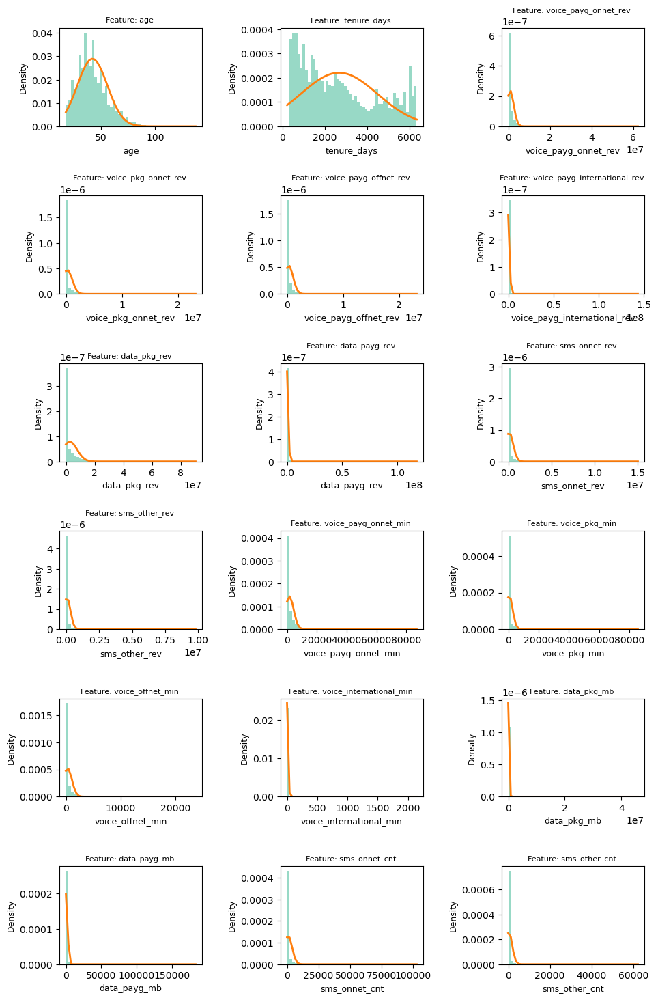

In [84]:
# Select only numeric columns from your dataset
numeric_columns = data.select_dtypes(include=[np.number]).columns
numeric_columns = numeric_columns.drop('churn_status')

# Custom colors similar to the attached image
hist_color = "#53c1a1"  # Light teal/green color for histograms
line_color = "#ff7f0e"  # Orange color for normal distribution overlay

# Set a minimum threshold for sigma to avoid underflow
sigma_threshold = 1e-6

# Calculate the number of rows and columns for subplots based on the number of numeric features
n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Round up to ensure all features fit

# Loop through each numeric feature to create a histogram with a normal distribution overlay
fig, ax = plt.subplots(n_rows, n_cols, figsize=(10, 15))  # Increase figure size
ax = ax.flatten()

for c, column in enumerate(numeric_columns):
    # Calculate the mean and standard deviation
    mu, sigma = data[column].mean(), data[column].std()

    # Set up the histogram with 50 bins
    count, bins, ignored = ax[c].hist(data[column].dropna(), bins=50, density=True, alpha=0.6, color=hist_color)

    # Plot the normal distribution overlay if sigma is above the threshold
    if sigma > sigma_threshold:
        # Clip the values of (bins - mu) to avoid extreme exponents in exp()
        exponent = -(np.clip(bins - mu, -10 * sigma, 10 * sigma) ** 2) / (2 * sigma ** 2)
        normal_dist = 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(exponent)
        ax[c].plot(bins, normal_dist, linewidth=2, color=line_color)
    else:
        print(f"Skipping normal distribution overlay for {column} due to low standard deviation.")

    ax[c].set_title(f'Feature: {column} ', fontsize=8)  # Reduced font size
    ax[c].set_xlabel(column, fontsize=9)
    ax[c].set_ylabel('Density', fontsize=9)

# Hide any unused subplots if there are extra slots in the grid
for i in range(len(numeric_columns), len(ax)):
    ax[i].axis('off')

# Adjust layout with additional padding to prevent text overlap
plt.tight_layout(pad=2.0)
plt.savefig('Feature_hists_norm.pdf', dpi=300)
plt.show()


#### Categorical Features

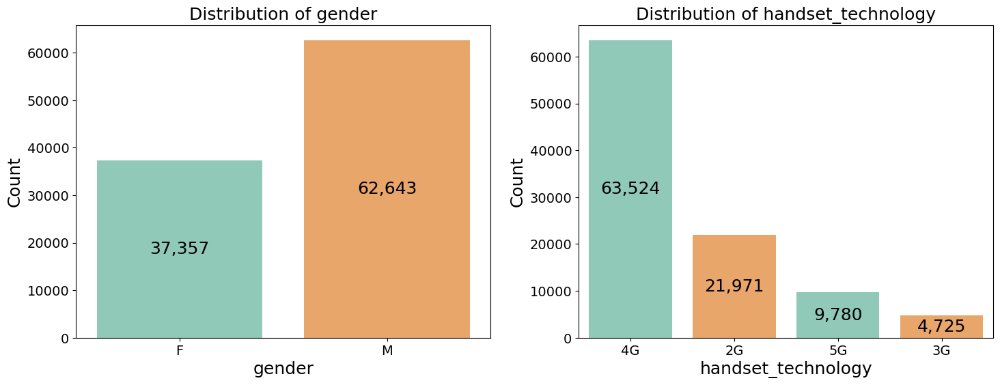

In [17]:
# List of categorical columns to plot
categorical_columns = ['gender', 'handset_technology']

# Set up the figure size and number of subplots
fig, ax = plt.subplots(1, len(categorical_columns), figsize=(15, 6))

# Define colors with transparency (alpha)
colors = ['#53c1a1', '#ff7f0e']  # Teal and Orange
alpha = 0.7  # Transparency level

# Loop through each categorical feature to create a count plot with data labels
for i, column in enumerate(categorical_columns):
    plot = sns.countplot(data=data, x=column, palette=colors, ax=ax[i], alpha=alpha)
    ax[i].set_title(f'Distribution of {column}', fontsize=18)
    ax[i].tick_params(axis='x', labelsize=14)
    ax[i].tick_params(axis='y', labelsize=14)
    ax[i].set_xlabel(column, fontsize=18)
    ax[i].set_ylabel('Count', fontsize=18)
    
    # Add data labels in the center of each bar
    for p in plot.patches:
        height = p.get_height()
        plot.annotate(f'{int(height):,}',  # Format the count with comma separator
                      (p.get_x() + p.get_width() / 2, height / 2),  # Center inside the bar
                      ha='center', va='center', fontsize=18, color='black')

# Adjust layout for readability
plt.tight_layout(pad=2.0)
plt.savefig('Categorical_Feature_BarPlots_Refined.pdf', dpi=300)
plt.show()


#### 2-2-2 Checking the distribution of dataset attributes over target variable

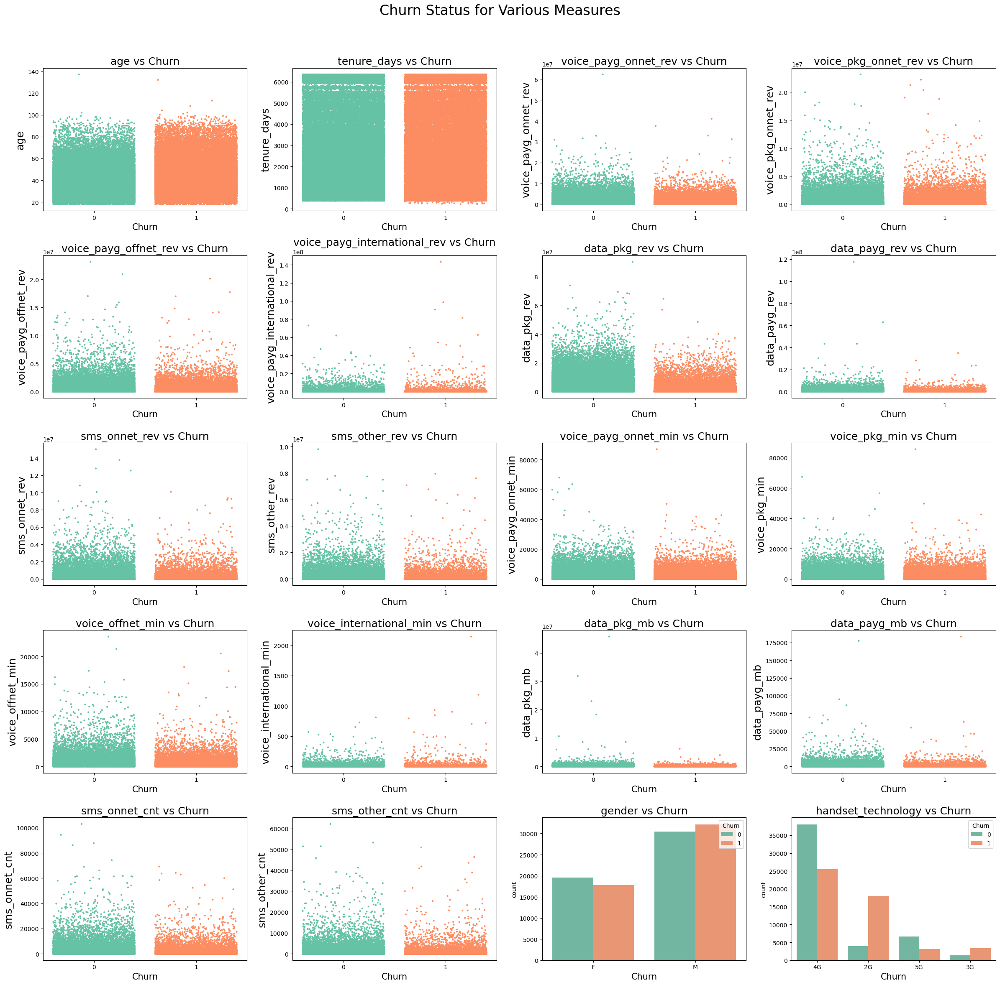

In [86]:
# List of numerical columns for plotting
numerical_columns = [
    'age', 'tenure_days', 'voice_payg_onnet_rev', 'voice_pkg_onnet_rev', 
    'voice_payg_offnet_rev', 'voice_payg_international_rev', 'data_pkg_rev', 'data_payg_rev', 
    'sms_onnet_rev', 'sms_other_rev', 'voice_payg_onnet_min', 'voice_pkg_min', 'voice_offnet_min', 
    'voice_international_min', 'data_pkg_mb', 'data_payg_mb', 'sms_onnet_cnt', 'sms_other_cnt'
]

# Adding categorical columns
categorical_columns = ['gender', 'handset_technology']

# Combine numerical and categorical columns
all_columns = numerical_columns + categorical_columns

# Setting up subplots in a grid
num_plots = len(all_columns)
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(24, 24))  # Increased figure size for wider plots
fig.suptitle('Churn Status for Various Measures', fontsize=24)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through each column to create individual plots
for i, column in enumerate(all_columns):
    if column in numerical_columns:
        sns.stripplot(
            data=data, x='churn_status', y=column, jitter=0.4, size=3,  # Adjust jitter and marker size
            palette=sns.color_palette("Set2", 2), ax=axes[i]
        )
        axes[i].set_ylabel(column, fontsize=18)  # Increased font size for y-axis label
    else:
        sns.countplot(
            data=data, x=column, hue='churn_status', palette=sns.color_palette("Set2", 2), ax=axes[i]
        )
        axes[i].legend(title='Churn', loc='upper right')

    axes[i].set_title(f'{column} vs Churn', fontsize=18)  # Increased font size for subplot title
    axes[i].set_xlabel('Churn', fontsize=15)  # Increased font size for x-axis label

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#### 2-2-3 Checking The distribution of Target Classes

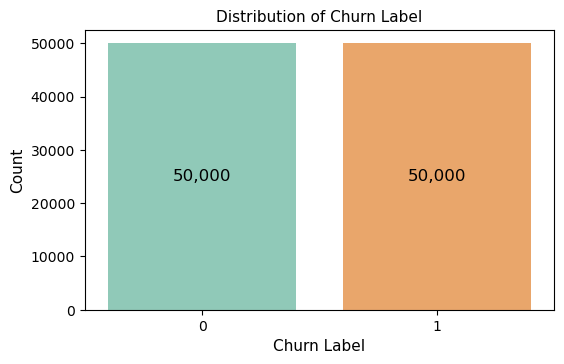

In [87]:
# Set up the figure
fig, ax = plt.subplots(figsize=(6, 4))

# Define colors with transparency (alpha)
colors = ['#53c1a1', '#ff7f0e']  # Teal and Orange
alpha = 0.7  # Transparency level

# Plot the distribution of the target variable (churn_status)
plot = sns.countplot(data=data, x='churn_status', palette=colors, alpha=alpha, ax=ax)
ax.set_title('Distribution of Churn Label', fontsize=11)
ax.set_xlabel('Churn Label', fontsize=11)
ax.set_ylabel('Count', fontsize=11)

# Add data labels in the center of each bar
for p in plot.patches:
    height = p.get_height()
    plot.annotate(f'{int(height):,}',  # Format the count with comma separator
                  (p.get_x() + p.get_width() / 2, height / 2),  # Center inside the bar
                  ha='center', va='center', fontsize=12, color='black')

# Adjust layout for readability
plt.tight_layout(pad=2.0)
plt.savefig('Target_Distribution_BarPlot.pdf', dpi=300)
plt.show()


## 2-3 Outlier Analysis

#### Box-Plot of Features

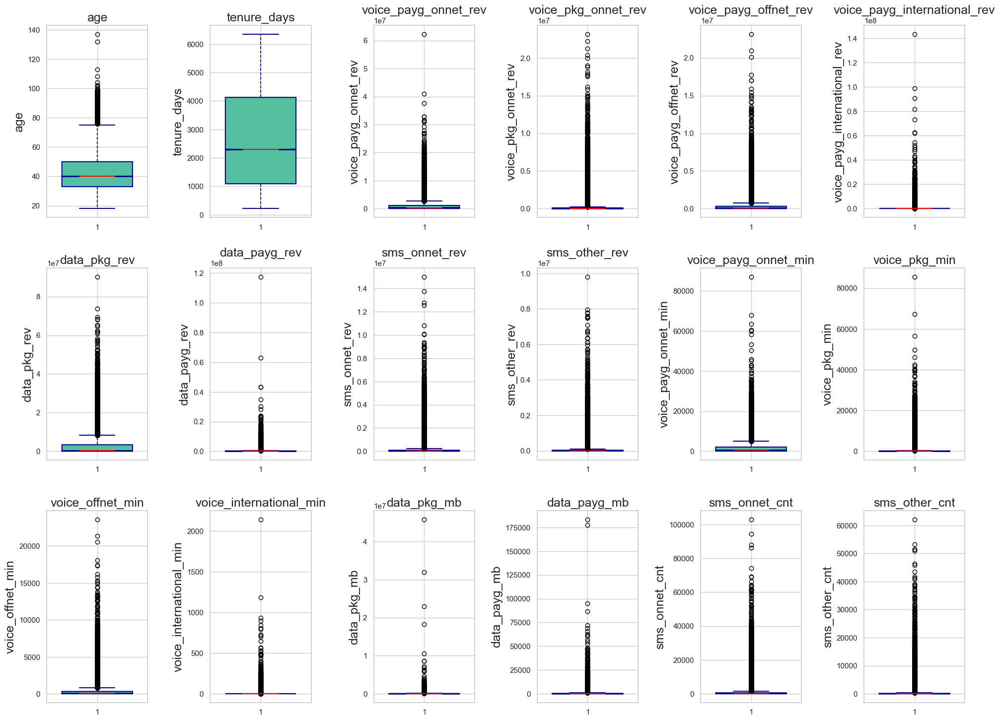

In [81]:
# Select only numeric columns from your dataset and exclude 'churn_status'
numeric_columns = data.select_dtypes(include=[np.number]).columns
numeric_columns = numeric_columns.drop('churn_status')  # Exclude 'churn_status'

# Apply clipping at the 95th percentile for each numeric column to limit extreme values
clipped_data = data[numeric_columns].apply(lambda x: x.clip(upper=x.quantile(1)))

# Define the number of rows and columns for the subplot grid
n_cols = 6
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Round up to ensure all features fit

# Set up the figure size
fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, 15))
ax = ax.flatten()

# Loop through each numeric feature to create a notched box plot with border
for i, column in enumerate(numeric_columns):
    # Create a box plot using Matplotlib with a notch and a visible edge
    ax[i].boxplot(clipped_data[column].dropna(), notch=True, patch_artist=True,
                  boxprops=dict(facecolor='#53c1a1', color='darkblue', linewidth=1.5),
                  medianprops=dict(color='red', linewidth=1.5),
                  whiskerprops=dict(color='darkblue', linestyle='--', linewidth=1.2),
                  capprops=dict(color='darkblue', linewidth=1.5),
                  flierprops=dict(marker='o', color='gray', markersize=6),
                  widths=0.7)
    
    # Set title and labels
    ax[i].set_title(f'{column}', fontsize=18)
    ax[i].set_xlabel('')
    ax[i].set_ylabel(column, fontsize=18)

# Hide any unused subplots if there are extra slots in the grid
for i in range(len(numeric_columns), len(ax)):
    ax[i].axis('off')

# Adjust layout for better readability
plt.tight_layout(pad=2.0)
plt.savefig('Numeric_Features_BoxPlots_Refined.pdf', dpi=300)
plt.show()


## 2-4 Correlation Analysis

#### Checking the Correlations Between Numeric Features (Using Heatmaps)

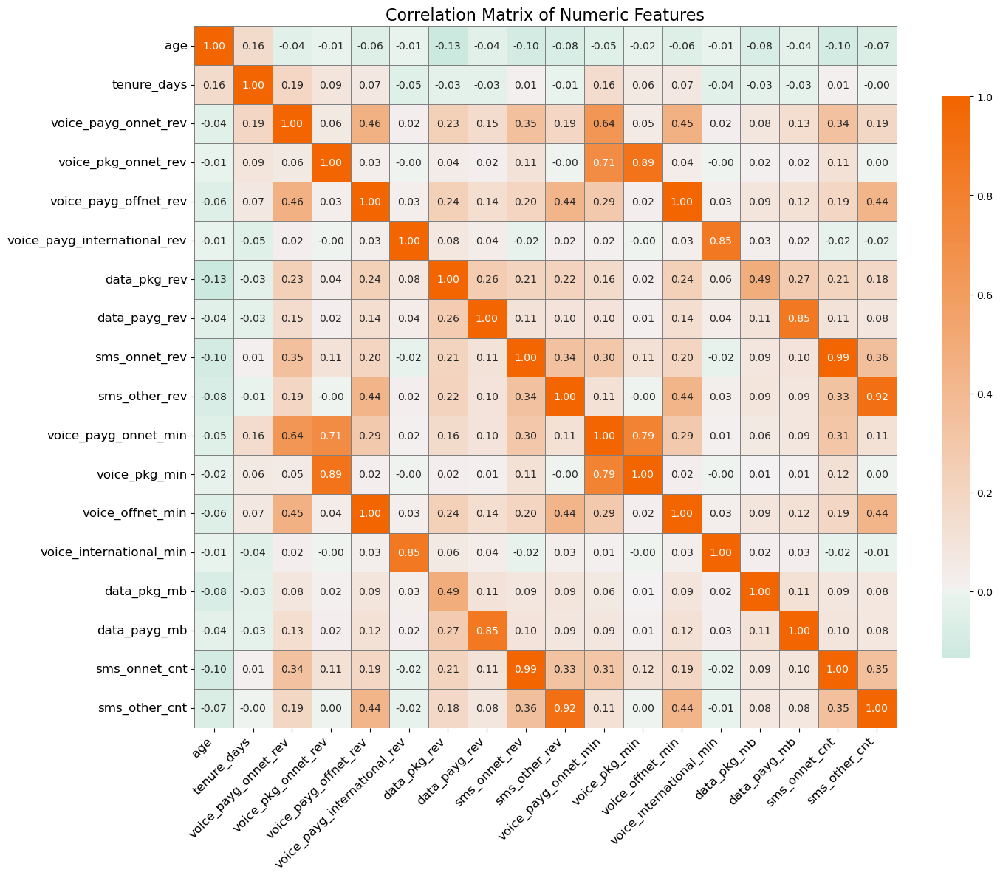

In [16]:
# Select only numeric columns from your dataset and exclude 'churn_status'
numeric_columns = data.select_dtypes(include=[np.number]).columns
numeric_columns = numeric_columns.drop('churn_status')  # Exclude 'churn_status'
correlation_matrix = data[numeric_columns].corr()

# Create a custom diverging color map from teal to orange
cmap = sns.diverging_palette(150, 24, s=100, l=60, as_cmap=True)  # Adjusted to match theme colors

# Set up the figure size and plot the heatmap
plt.figure(figsize=(15, 12))
heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap=cmap, center=0,
                      cbar_kws={"shrink": 0.8}, annot_kws={"size": 10}, square=True,
                      linewidths=0.5, linecolor='gray')

# Set the font size of x and y tick labels after plotting
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=12)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=12)

# Add title and adjust the layout
plt.title('Correlation Matrix of Numeric Features', fontsize=16)
plt.tight_layout()
plt.savefig('Correlation_Matrix_Custom_Theme_with_Labels.pdf', dpi=300)
plt.show()


#### VIF Score

In [ ]:
# VIF scores (Churn thesis_Tilburg)
# Besides the correlation test, the variance influence factor (VIF) was calculated to detect
# collinearity and to see which variable needs to be removed. The VIF has been used often in the
# literature to detect collinearity. The VIF score represents how much of the variance in the
# dependent variable is explained by the independent variable (Lavery, Acharya, Sivo, & Xu,
# 2019). A VIF score of one indicates that there is no collinearity. The higher the VIF score, the
# more problematic the collinearity will be. A VIF score of five or higher indicates a high
# correlation and it should therefore be removed (Daoud, 2017). The package “car” has a function
# named “vif” that allows to calculate the VIF score.

In [17]:
# Select only numeric columns from your dataset and exclude 'churn_status'
numeric_columns = data.select_dtypes(include=[np.number]).columns
numeric_columns = numeric_columns.drop('churn_status')  # Exclude 'churn_status'

# Create a dataframe with numeric features
X = data[numeric_columns]

# Handle missing or infinite values
X = X.replace([np.inf, -np.inf], np.nan)  # Replace infinite values with NaN
X = X.dropna()  # Drop rows with NaN values

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF results
print(vif_data)

# Identify features with high VIF scores
threshold = 10  # Common threshold (can be adjusted)
high_vif_features = vif_data[vif_data['VIF'] > threshold]
print("\nFeatures with high VIF (potential multicollinearity):")
print(high_vif_features)


                         Feature         VIF
0                            age    3.191357
1                    tenure_days    3.244080
2           voice_payg_onnet_rev   35.270920
3            voice_pkg_onnet_rev    5.400142
4          voice_payg_offnet_rev  284.564370
5   voice_payg_international_rev    3.742611
6                   data_pkg_rev    1.941067
7                  data_payg_rev    4.106273
8                  sms_onnet_rev   66.500181
9                  sms_other_rev    6.989564
10          voice_payg_onnet_min   92.240132
11                 voice_pkg_min   50.392323
12              voice_offnet_min  284.373751
13       voice_international_min    3.737795
14                   data_pkg_mb    1.421242
15                  data_payg_mb    4.054844
16                 sms_onnet_cnt   66.121216
17                 sms_other_cnt    6.953403

Features with high VIF (potential multicollinearity):
                  Feature         VIF
2    voice_payg_onnet_rev   35.270920
4   voice_payg

## 2-5 Association test

In [18]:
# List of categorical features
categorical_columns = ['gender', 'handset_technology']  # Update this list with all categorical features

# Function to calculate Chi-square test and Cramér's V
def chi_square_test(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2, p, dof, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))
    return chi2, p, dof, cramers_v

# Calculate Chi-square test for each pair of categorical features
association_data = []
for col1, col2 in itertools.combinations(categorical_columns, 2):
    chi2, p, dof, cramers_v = chi_square_test(data[col1], data[col2])
    association_data.append((col1, col2, chi2, p, dof, cramers_v))

# Create a DataFrame to display the association table
association_table = pd.DataFrame(association_data, columns=["Feature 1", "Feature 2", "Chi-square", "p-value", "Degrees of Freedom", "Cramér's V"])

# Style the table with color gradients for Chi-square and Cramér's V values
styled_table = association_table.style \
    .background_gradient(subset=['Chi-square'], cmap="Oranges") \
    .background_gradient(subset=["Cramér's V"], cmap="Greens") \
    .format({"Chi-square": "{:.2f}", "p-value": "{:.2f}", "Cramér's V": "{:.2f}"}) \
    .set_caption("Association Table with Chi-square and Cramér's V")

# Display the styled table in Jupyter Notebook or export it
styled_table


,Feature 1,Feature 2,Chi-square,p-value,Degrees of Freedom,Cramér's V
0,gender,handset_technology,516.62,0.00,3,0.07


In [47]:
###### Features Tested: gender and handset_technology.
# Chi-square Statistic (520.007): This value reflects the strength of association between the gender and handset_technology features. Higher values suggest a stronger association, but interpretation also depends on the p-value.
# p-value (2.201013e-112): This very low p-value (< 0.05) indicates a statistically significant association between gender and handset_technology. Thus, we can reject the null hypothesis that these two variables are independent.
# Degrees of Freedom (3): This is based on the contingency table dimensions and reflects the complexity of the association.
# Cramér's V (0.072): This value provides a measure of the strength of the association, with values closer to 1 indicating a stronger association. In this case, a Cramér's V of 0.072 suggests a weak association between gender and handset_technology, even though the association is statistically significant.

# Interpretation
# While the association between gender and handset_technology is statistically significant (as indicated by the low p-value), the strength of the association is weak (Cramér's V = 0.072). This means that, although there is an association, gender and handset_technology do not strongly influence each other.

### Pair wize Plots 


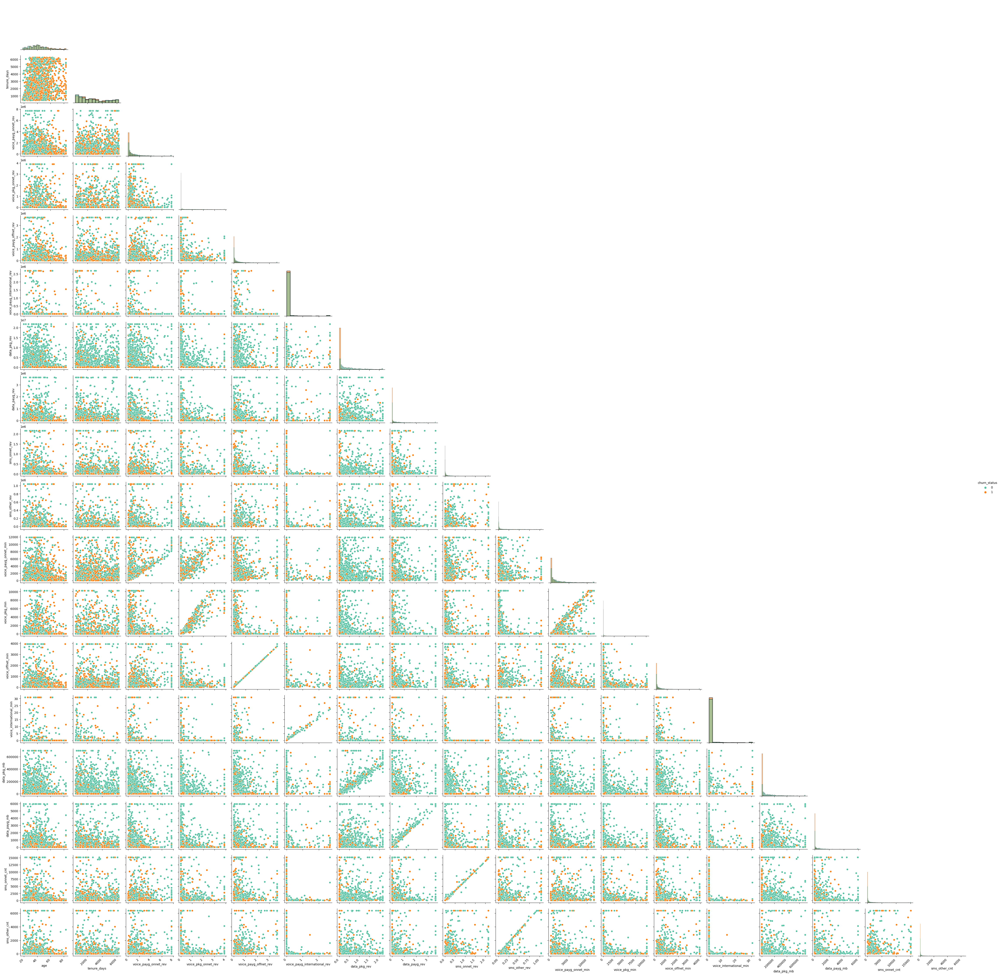

In [48]:
# Take a random sample of 100 rows of numeric data and clip outliers
numeric_sampled = data.select_dtypes(include=[np.number]).sample(n=2000, random_state=42)
clipped_sampled_data = numeric_sampled.apply(lambda x: x.clip(upper=x.quantile(0.99)))

# Add `churn_status` back as `hue` for color coding if it's in the original data
if 'churn_status' in data.columns:
    clipped_sampled_data['churn_status'] = data['churn_status'].sample(n=2000, random_state=42).values

# Generate the pair plot with the clipped and sampled data
pairplot = sns.pairplot(clipped_sampled_data, diag_kind='hist', hue='churn_status', palette=['#53c1a1', '#ff7f0e'], corner=True)

# Set font size for all tick labels
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Rotate x-axis labels for better visibility
for ax in pairplot.axes[-1, :]:  # Last row
    if ax is not None:  # Check if the axis is not None
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

plt.show()

# 3- Data Preprocessing

### 3-1 Manage Duplicates

In [7]:
# Check for duplicate rows in the dataset
duplicates = data.duplicated()

# Count the total number of duplicate rows
num_duplicates = duplicates.sum()
print(f"Number of duplicate rows: {num_duplicates}")

# Drop duplicate rows and display a message
if num_duplicates > 0:
    data = data.drop_duplicates()
    print("Duplicates dropped.")
else:
    print("No duplicate rows found.")


Number of duplicate rows: 1
Duplicates dropped.


### 3-2 Manage Missing Values

In [8]:
# Calculate the portion of missing values for each column
missing_portion = data.isnull().mean()
print(missing_portion)

gender                          0.00000
age                             0.00125
tenure_days                     0.00000
handset_technology              0.00000
voice_payg_onnet_rev            0.00000
voice_pkg_onnet_rev             0.00000
voice_payg_offnet_rev           0.00000
voice_payg_international_rev    0.00000
data_pkg_rev                    0.00000
data_payg_rev                   0.00000
sms_onnet_rev                   0.00000
sms_other_rev                   0.00000
voice_payg_onnet_min            0.00000
voice_pkg_min                   0.00000
voice_offnet_min                0.00000
voice_international_min         0.00000
data_pkg_mb                     0.00000
data_payg_mb                    0.00000
sms_onnet_cnt                   0.00000
sms_other_cnt                   0.00000
churn_status                    0.00000
dtype: float64


In [9]:
data.dropna(inplace=True)

In [10]:
data.shape

(99874, 21)

### 3-3 Manage Noises

In [11]:
# Select only numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Filter out rows that have any negative values in numeric columns
data = data[(numeric_data >= 0).all(axis=1)]

print(data.shape)

(99865, 21)


### 3-4 Manage High Skew Features

In [12]:
# box-cox

# Select only numeric features
numeric_features = data.select_dtypes(include=['number'])

# Calculate skewness for numeric features
skewness = numeric_features.skew()

# Identify highly skewed numeric features (e.g., skewness > 1)
high_skew_features = skewness[skewness > 1].index.tolist()

# Apply Box-Cox transformation to only these features
lambda_values = {}
for feature in high_skew_features:
    # Shift to positive if necessary
    shift_value = abs(numeric_features[feature].min()) + 1 if (numeric_features[feature] <= 0).any() else 0
    numeric_features[feature] = numeric_features[feature] + shift_value

    # Apply Box-Cox transformation
    numeric_features[feature], fitted_lambda = boxcox(numeric_features[feature])
    lambda_values[feature] = {
        'lambda': fitted_lambda,
        'shift': shift_value
    }

# Create a summary of the transformations
lambda_df = pd.DataFrame(lambda_values).T
lambda_df.columns = ['Optimal Lambda', 'Shift Applied']

# Update the original dataset with the transformed numeric features
data.update(numeric_features)

# Display the Box-Cox transformation summary
print("Box-Cox Transformation Summary:")
print(lambda_df)


Box-Cox Transformation Summary:
                              Optimal Lambda  Shift Applied
voice_payg_onnet_rev                0.198684            1.0
voice_pkg_onnet_rev                -0.201793            1.0
voice_payg_offnet_rev               0.161640            1.0
voice_payg_international_rev       -0.964738            1.0
data_pkg_rev                        0.050028            1.0
data_payg_rev                       0.021631            1.0
sms_onnet_rev                       0.117193            1.0
sms_other_rev                       0.077617            1.0
voice_payg_onnet_min                0.159630            1.0
voice_pkg_min                      -0.285478            1.0
voice_offnet_min                    0.067713            1.0
voice_international_min            -6.852043            1.0
data_pkg_mb                         0.039659            1.0
data_payg_mb                       -0.054613            1.0
sms_onnet_cnt                       0.013593            1.0
sms_othe

### 3-5 Outlier detection

In [13]:
# Local Outlier Factor (LOF)

# copy data to data_lof
data_lof = data

from sklearn.neighbors import LocalOutlierFactor
import pandas as pd

# Assuming your dataset is stored in a DataFrame called data
# The features you want to apply LOF to
features = ['age', 'tenure_days', 'voice_pkg_onnet_rev','voice_payg_international_rev', 'data_pkg_rev', 'data_payg_rev', 
    'sms_other_rev', 'voice_payg_onnet_min', 'voice_offnet_min', 
    'voice_international_min', 'data_pkg_mb', 'data_payg_mb', 'sms_onnet_cnt', 'sms_other_cnt']

# Initialize the Local Outlier Factor model
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)  # You can adjust contamination based on your data

# Fit the model and predict outliers (-1 indicates an outlier, 1 indicates inlier)
data_lof['lof_prediction'] = lof.fit_predict(data_lof[features])

# Filter out outliers (only keep rows that are not outliers)
data_clean_lof = data_lof[data_lof['lof_prediction'] == 1].copy()

# Optionally, drop the 'lof_prediction' column if no longer needed
data_clean_lof.drop(columns=['lof_prediction'], inplace=True)


In [14]:
data_clean_lof.shape

(94871, 21)

Number of outliers detected: 4994
Percentage of outliers: 5.00%

Summary of features for detected outliers:
               age  tenure_days  voice_pkg_onnet_rev  \
count  4994.000000  4994.000000          4994.000000   
mean     50.595314  3232.131758             1.542948   
std      21.362179  2185.196515             2.169775   
min      18.000000   216.000000             0.000000   
25%      33.000000  1055.250000             0.000000   
50%      47.000000  2843.000000             0.000000   
75%      68.000000  5537.000000             4.536026   
max     137.000000  6348.000000             4.792426   

       voice_payg_international_rev  data_pkg_rev  data_payg_rev  \
count                   4994.000000   4994.000000    4994.000000   
mean                       0.079077     12.615835       7.286418   
std                        0.275185     10.060970       6.795000   
min                        0.000000      0.000000       0.000000   
25%                        0.000000      0.0000

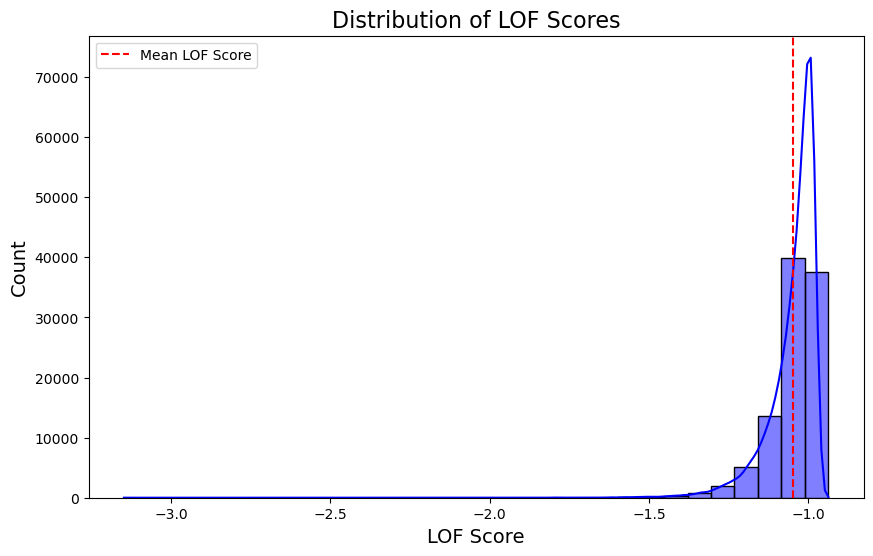

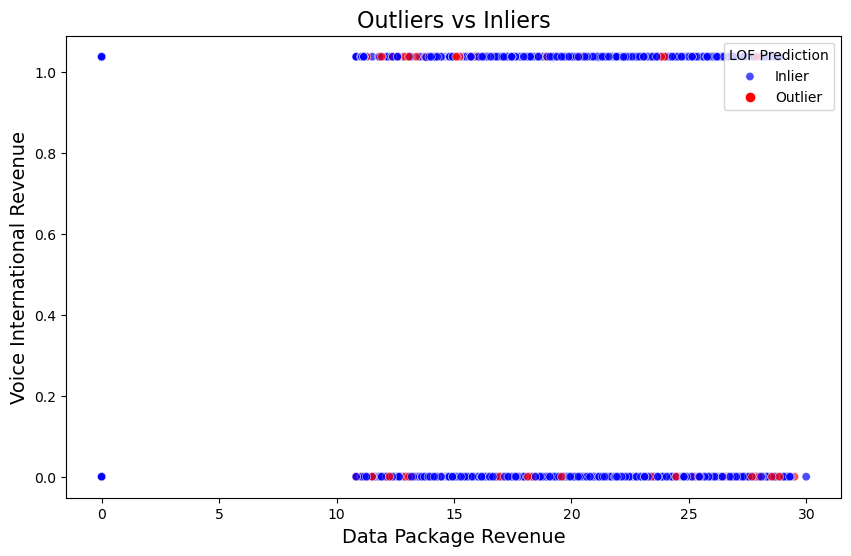

LOF analysis results have been saved to 'lof_analysis_results.csv' and outliers to 'lof_outliers.csv'.


In [15]:
# copy data to data_lof
data_lof = data
features = ['age', 'tenure_days', 'voice_pkg_onnet_rev','voice_payg_international_rev', 'data_pkg_rev', 'data_payg_rev', 
    'sms_other_rev', 'voice_payg_onnet_min', 'voice_offnet_min', 
    'voice_international_min', 'data_pkg_mb', 'data_payg_mb', 'sms_onnet_cnt', 'sms_other_cnt']

# Initialize LOF and get predictions
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
data_lof['lof_prediction'] = lof.fit_predict(data_lof[features])

# Add LOF scores to the dataset for analysis
data_lof['lof_score'] = lof.negative_outlier_factor_  # LOF scores (lower values indicate stronger outliers)

# Count and percentage of outliers
num_outliers = (data_lof['lof_prediction'] == -1).sum()
total_points = len(data_lof)
outlier_percentage = (num_outliers / total_points) * 100
print(f"Number of outliers detected: {num_outliers}")
print(f"Percentage of outliers: {outlier_percentage:.2f}%")

# Summary of outlier features
outliers = data_lof[data_lof['lof_prediction'] == -1]
outlier_summary = outliers[features].describe()
print("\nSummary of features for detected outliers:")
print(outlier_summary)

# Visualization: LOF scores distribution
plt.figure(figsize=(10, 6))
sns.histplot(data_lof['lof_score'], bins=30, kde=True, color="blue")
plt.title("Distribution of LOF Scores", fontsize=16)
plt.xlabel("LOF Score", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.axvline(x=lof.negative_outlier_factor_.mean(), color='red', linestyle='--', label='Mean LOF Score')
plt.legend()
plt.show()

# Visualization: Outliers vs. Inliers in a pair of features
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='data_pkg_rev', 
    y='voice_payg_international_rev', 
    data=data_lof, 
    hue='lof_prediction', 
    palette={1: 'blue', -1: 'red'}, 
    alpha=0.7
)
plt.title("Outliers vs Inliers", fontsize=16)
plt.xlabel("Data Package Revenue", fontsize=14)
plt.ylabel("Voice International Revenue", fontsize=14)
plt.legend(title="LOF Prediction", loc="upper right", labels=["Inlier", "Outlier"])
plt.show()

# Save results to a CSV file
data_lof.to_csv('lof_analysis_results.csv', index=False)
outliers.to_csv('lof_outliers.csv', index=False)

print("LOF analysis results have been saved to 'lof_analysis_results.csv' and outliers to 'lof_outliers.csv'.")


# 4- Feature Selection

#####  Filter-Based Feature Selection

####  1- Using Correlation (for Numeric Features Only)

In [16]:
import pandas as pd
import numpy as np

# Example: Replace this with your dataset
# data = pd.read_csv('your_dataset.csv')

# Select only numeric features
numeric_features = data_clean_lof.select_dtypes(include=[float, int]).columns
X = data_clean_lof[numeric_features].drop(columns=['churn_status'], errors='ignore')  # Exclude target column
y = data_clean_lof['churn_status']  # Replace 'churn_status' with your target column name

# Calculate correlation of each feature with the target
correlations = X.corrwith(y)

# Set a threshold for feature selection (e.g., absolute correlation > 0.1)
threshold = 0.2
selected_features = correlations[abs(correlations) > threshold].index.tolist()
unselected_features = correlations[abs(correlations) <= threshold].index.tolist()

# Display results
print("Selected Features (Correlation > 0.2):")
print(selected_features)

print("\nUnselected Features (Correlation <= 0.2):")
print(unselected_features)


Selected Features (Correlation > 0.2):
['voice_payg_onnet_rev', 'voice_payg_offnet_rev', 'data_pkg_rev', 'data_payg_rev', 'sms_onnet_rev', 'sms_other_rev', 'voice_payg_onnet_min', 'voice_offnet_min', 'data_pkg_mb', 'data_payg_mb', 'sms_onnet_cnt', 'sms_other_cnt']

Unselected Features (Correlation <= 0.2):
['age', 'tenure_days', 'voice_pkg_onnet_rev', 'voice_payg_international_rev', 'voice_pkg_min', 'voice_international_min']


#### 2- Using Mutual Information (for Mixed Data Types)

In [17]:
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder

# Example: Replace this with your dataset
# data_clean_lof = pd.read_csv('your_dataset.csv')

# Separate features and target
X = data_clean_lof.drop(columns=['churn_status'], errors='ignore')  # Exclude target column
y = data_clean_lof['churn_status']  # Target column

# Encode non-numeric features
for column in X.select_dtypes(include=['object', 'category']).columns:
    le = LabelEncoder()
    X[column] = le.fit_transform(X[column])

# Handle missing values if any (fill with median, mean, or drop rows)
X = X.fillna(X.median())

# Calculate mutual information scores
mutual_info = mutual_info_classif(X, y, random_state=42)

# Create a DataFrame for feature scores
feature_scores = pd.DataFrame({
    'Feature': X.columns,
    'Mutual Information Score': mutual_info
}).sort_values(by='Mutual Information Score', ascending=False)

# Display selected features and their scores
print("Feature Importance Based on Mutual Information:")
print(feature_scores)


Feature Importance Based on Mutual Information:
                         Feature  Mutual Information Score
16                   data_pkg_mb                  0.406838
8                   data_pkg_rev                  0.312050
9                  data_payg_rev                  0.131175
17                  data_payg_mb                  0.097805
3             handset_technology                  0.082614
11                 sms_other_rev                  0.065592
19                 sms_other_cnt                  0.062329
10                 sms_onnet_rev                  0.060965
18                 sms_onnet_cnt                  0.059900
6          voice_payg_offnet_rev                  0.038424
14              voice_offnet_min                  0.036154
4           voice_payg_onnet_rev                  0.031361
12          voice_payg_onnet_min                  0.031288
13                 voice_pkg_min                  0.019225
1                            age                  0.017528
5       

In [18]:
# Remove Specified Features from the Data

# List of features to remove
features_to_remove = ['voice_payg_international_rev', 'voice_international_min']

# Drop these features from the dataset
data_clean_lof = data_clean_lof.drop(columns=features_to_remove)


In [19]:
data_clean_lof.shape

(94871, 19)

In [20]:
data_clean_lof.head()

,gender,age,tenure_days,handset_technology,voice_payg_onnet_rev,voice_pkg_onnet_rev,voice_payg_offnet_rev,data_pkg_rev,data_payg_rev,sms_onnet_rev,sms_other_rev,voice_payg_onnet_min,voice_pkg_min,voice_offnet_min,data_pkg_mb,data_payg_mb,sms_onnet_cnt,sms_other_cnt,churn_status
0,F,64.0,1500,4G,58.065108,4.478517,34.814468,18.922290,14.782197,24.964780,16.082891,11.743403,2.870689,5.700779,12.229215,5.418108,6.992227,4.402734,0
1,M,58.0,1209,2G,7.507766,0.000000,0.000000,0.000000,14.154227,14.747017,0.000000,0.096039,0.000000,0.000000,0.000000,4.852592,3.701003,0.000000,1
2,F,46.0,3177,4G,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0
3,M,42.0,3160,4G,32.597348,4.669290,24.166148,24.841395,0.000000,13.830297,0.000000,15.343899,3.119117,3.330360,16.007885,0.000000,3.370779,0.000000,0
4,M,45.0,981,4G,44.387258,0.000000,22.793905,0.000000,0.000000,0.000000,0.000000,6.832074,0.000000,3.002315,0.000000,0.000000,0.000000,0.000000,1


# 5- Feature engineering

### 5-1 Creating New Features

In [21]:
X = data_clean_lof.drop(columns=['churn_status'])
y = data_clean_lof['churn_status']

In [22]:
# Derived Feature: Tenure per Year of Age

# Derived Feature : Tenure per Year of Age
X['tenure_per_year_of_age'] = ((X['tenure_days'] / 365) / X['age'])

# Drop the original columns
X = X.drop(columns=['age', 'tenure_days'])

In [23]:
X.shape

(94871, 17)

In [24]:
X.head()

,gender,handset_technology,voice_payg_onnet_rev,voice_pkg_onnet_rev,voice_payg_offnet_rev,data_pkg_rev,data_payg_rev,sms_onnet_rev,sms_other_rev,voice_payg_onnet_min,voice_pkg_min,voice_offnet_min,data_pkg_mb,data_payg_mb,sms_onnet_cnt,sms_other_cnt,tenure_per_year_of_age
0,F,4G,58.065108,4.478517,34.814468,18.922290,14.782197,24.964780,16.082891,11.743403,2.870689,5.700779,12.229215,5.418108,6.992227,4.402734,0.064212
1,M,2G,7.507766,0.000000,0.000000,0.000000,14.154227,14.747017,0.000000,0.096039,0.000000,0.000000,0.000000,4.852592,3.701003,0.000000,0.057109
2,F,4G,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.189220
3,M,4G,32.597348,4.669290,24.166148,24.841395,0.000000,13.830297,0.000000,15.343899,3.119117,3.330360,16.007885,0.000000,3.370779,0.000000,0.206132
4,M,4G,44.387258,0.000000,22.793905,0.000000,0.000000,0.000000,0.000000,6.832074,0.000000,3.002315,0.000000,0.000000,0.000000,0.000000,0.059726


### 5-2 Encoding Categorical Features

In [25]:
X = pd.get_dummies(X, columns=['gender'], drop_first=True)
X = pd.get_dummies(X, columns=['handset_technology'], drop_first=True)

X['gender_M'] = X['gender_M'].astype(int)
X['handset_technology_3G'] = X['handset_technology_3G'].astype(int)
X['handset_technology_4G'] = X['handset_technology_4G'].astype(int)
X['handset_technology_5G'] = X['handset_technology_5G'].astype(int)

In [26]:
X.shape

(94871, 19)

In [27]:
X.head()

,voice_payg_onnet_rev,voice_pkg_onnet_rev,voice_payg_offnet_rev,data_pkg_rev,data_payg_rev,sms_onnet_rev,sms_other_rev,voice_payg_onnet_min,voice_pkg_min,voice_offnet_min,data_pkg_mb,data_payg_mb,sms_onnet_cnt,sms_other_cnt,tenure_per_year_of_age,gender_M,handset_technology_3G,handset_technology_4G,handset_technology_5G
0,58.065108,4.478517,34.814468,18.922290,14.782197,24.964780,16.082891,11.743403,2.870689,5.700779,12.229215,5.418108,6.992227,4.402734,0.064212,0,0,1,0
1,7.507766,0.000000,0.000000,0.000000,14.154227,14.747017,0.000000,0.096039,0.000000,0.000000,0.000000,4.852592,3.701003,0.000000,0.057109,1,0,0,0
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.189220,0,0,1,0
3,32.597348,4.669290,24.166148,24.841395,0.000000,13.830297,0.000000,15.343899,3.119117,3.330360,16.007885,0.000000,3.370779,0.000000,0.206132,1,0,1,0
4,44.387258,0.000000,22.793905,0.000000,0.000000,0.000000,0.000000,6.832074,0.000000,3.002315,0.000000,0.000000,0.000000,0.000000,0.059726,1,0,1,0


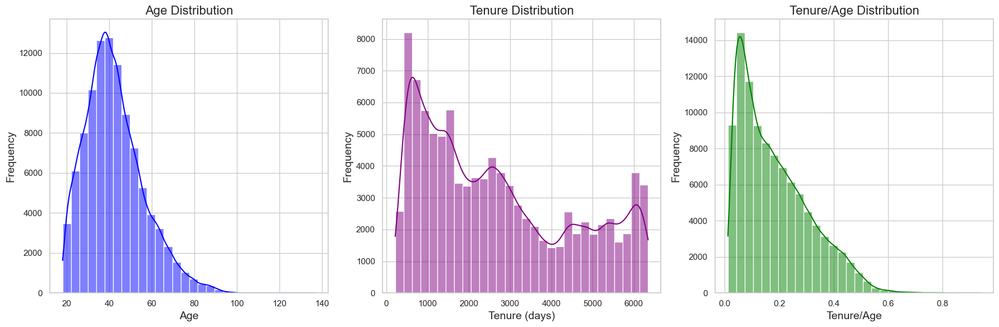

In [55]:
# Set a consistent style for better visuals
sns.set_theme(style="whitegrid")

# Set up the subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=False)

# Plot the age distribution
sns.histplot(X['age'], kde=True, color='blue', bins=30, ax=axes[0])
axes[0].set_title('Age Distribution', fontsize=16)
axes[0].set_xlabel('Age', fontsize=14)
axes[0].set_ylabel('Frequency', fontsize=14)

# Plot the tenure distribution
sns.histplot(X['tenure_days'], kde=True, color='purple', bins=30, ax=axes[1])
axes[1].set_title('Tenure Distribution', fontsize=16)
axes[1].set_xlabel('Tenure (days)', fontsize=14)
axes[1].set_ylabel('Frequency', fontsize=14)

# Plot the tenure/age distribution
sns.histplot(X['tenure_per_year_of_age'], kde=True, color='green', bins=30, ax=axes[2])
axes[2].set_title('Tenure/Age Distribution', fontsize=16)
axes[2].set_xlabel('Tenure/Age', fontsize=14)
axes[2].set_ylabel('Frequency', fontsize=14)

# Adjust spacing for clarity
plt.tight_layout()

# Display the plots
plt.show()

# 6-1 Data Splitting (into Train, Validation and Test)

In [ ]:
# First, split the data into train + validation and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Then, split the train + validation set into separate train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.125, random_state=42)  # 0.125 x 0.8 = 0.1

# Print the shapes of the resulting datasets
print("Training set:", X_train.shape, y_train.shape)
print("Validation set:", X_val.shape, y_val.shape)
print("Test set:", X_test.shape, y_test.shape)

In [ ]:
feature_names = [f"feature_{i}" for i in range(X_train.shape[1])]
print(feature_names)

## 6-2 Feature Scaling

most features have non-normal distribution. Thus, it may be more sensible to use data normalization rather than data standardization when rescaling the features.

In [ ]:
# Min-Max Normalization

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler only on the training set
X_train_scaled = scaler.fit_transform(X_train)

# Apply the same transformation to validation and test sets
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Convert back to DataFrame
X_train = pd.DataFrame(X_train_scaled, columns=X.columns)
X_val = pd.DataFrame(X_val_scaled, columns=X.columns)
X_test = pd.DataFrame(X_test_scaled, columns=X.columns)

# Print the shapes of the resulting datasets
print("Training set:", X_train_scaled.shape, y_train.shape)
print("Validation set:", X_val_scaled.shape, y_val.shape)
print("Test set:", X_test_scaled.shape, y_test.shape)

# 7- Model Training and Hyperparameter Tunning

### 7-1 Logistic Regression (LR)

Best Hyperparameters: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.001}


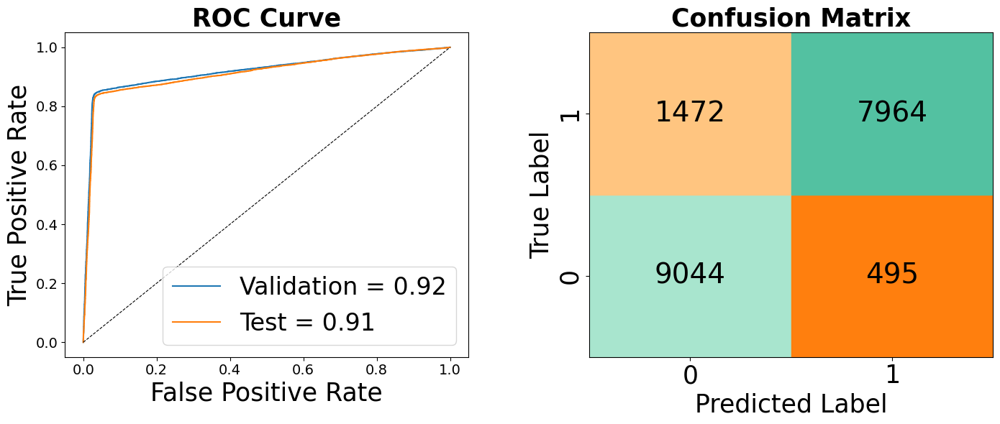


Validation Metrics:
Accuracy: 0.90, Precision: 0.95, Recall: 0.85, F1: 0.90, AUC: 0.92

Test Metrics:
Accuracy: 0.90, Precision: 0.94, Recall: 0.84, F1: 0.89, AUC: 0.91


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import (confusion_matrix, accuracy_score, precision_score,
                             recall_score, f1_score, roc_auc_score, roc_curve)

# Split data into train, validation, and test sets
# Replace `data` and `target` with your dataset and target variable
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Initialize the Logistic Regression model
logreg = LogisticRegression(max_iter=1000, random_state=42)

# Hyperparameter Tuning using GridSearchCV
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],              # Regularization strength
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],  # Regularization types
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg'],  # Compatible solvers
    'tol': [1e-4, 1e-3, 1e-2],                 # Tolerance for stopping criteria
}


grid_search = GridSearchCV(estimator=logreg, param_grid=param_grid, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the best Logistic Regression model
best_logreg = grid_search.best_estimator_

# Evaluate on the Validation Set
y_val_pred = best_logreg.predict(X_val)
y_val_proba = best_logreg.predict_proba(X_val)[:, 1]

# Validation Metrics
val_accuracy = accuracy_score(y_val, y_val_pred)
val_precision = precision_score(y_val, y_val_pred)
val_recall = recall_score(y_val, y_val_pred)
val_f1 = f1_score(y_val, y_val_pred)
val_auc = roc_auc_score(y_val, y_val_proba)

# Evaluate on the Test Set
y_test_pred = best_logreg.predict(X_test)
y_test_proba = best_logreg.predict_proba(X_test)[:, 1]

# Test Metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

# Confusion Matrix for Test Set
conf_matrix = confusion_matrix(y_test, y_test_pred)

# ROC Curve for Validation and Test Sets
val_fpr, val_tpr, _ = roc_curve(y_val, y_val_proba)
test_fpr, test_tpr, _ = roc_curve(y_test, y_test_proba)

# Create Subplots for ROC Curve and Confusion Matrix
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC Curve
axs[0].plot(val_fpr, val_tpr, label=f"Validation = {val_auc:.2f}")
axs[0].plot(test_fpr, test_tpr, label=f"Test = {test_auc:.2f}")
axs[0].plot([0, 1], [0, 1], 'k--', lw=0.8)
axs[0].set_title("ROC Curve", fontsize=25, fontweight='bold')
axs[0].set_xlabel("False Positive Rate", fontsize=25)
axs[0].set_ylabel("True Positive Rate", fontsize=25)
# axs[0].legend()
axs[0].legend(
    loc='lower right',                 # Change position
    bbox_to_anchor=(1.0, 0.0),         # Fine-tune position relative to the axes
    prop={'size': 24}
)
axs[0].tick_params(axis='both', labelsize=14)


# Plot Confusion Matrix with Custom Colors
# Define custom colors for TP, TN, FP, and FN
colors = {
    'TP': '#53c1a1',  # Green for True Positives
    'TN': '#a8e5ce',  # Light Green for True Negatives
    'FP': '#ff7f0e',  # Orange for False Positives
    'FN': '#ffc580'   # Light Orange for False Negatives
}

# Plot each cell of the confusion matrix with appropriate colors
n_rows, n_cols = conf_matrix.shape
for i in range(n_rows):
    for j in range(n_cols):
        value = conf_matrix[i, j]
        # Assign colors based on the cell meaning
        if i == j:  # Diagonal cells (TP, TN)
            color = colors['TP'] if i == 1 else colors['TN']
        else:  # Off-diagonal cells (FP, FN)
            color = colors['FP'] if j == 1 else colors['FN']
        # Draw the rectangle with the assigned color
        axs[1].add_patch(plt.Rectangle((j, i), 1, 1, color=color))
        # Add text in the center of the cell
        text_color = 'black' if value > conf_matrix.max() / 2 else 'black'
        axs[1].text(j + 0.5, i + 0.5, str(value), ha="center", va="center", color=text_color, fontsize=28)

# Configure Confusion Matrix axis labels and ticks
axs[1].set_xticks(np.arange(n_cols) + 0.5)
axs[1].set_yticks(np.arange(n_rows) + 0.5)
axs[1].set_xticklabels(['0', '1'], fontsize=25)
axs[1].set_yticklabels(['0', '1'], fontsize=25, rotation=90, verticalalignment='center')
axs[1].set_xlabel('Predicted Label', fontsize=25)
axs[1].set_ylabel('True Label', fontsize=25)

# Add title for Confusion Matrix
axs[1].set_title('Confusion Matrix', fontsize=25, fontweight='bold')
axs[1].set_xlim(0, n_cols)
axs[1].set_ylim(0, n_rows)
axs[1].grid(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()

# Print Metrics
print("\nValidation Metrics:")
print(f"Accuracy: {val_accuracy:.2f}, Precision: {val_precision:.2f}, Recall: {val_recall:.2f}, F1: {val_f1:.2f}, AUC: {val_auc:.2f}")
print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.2f}, Precision: {test_precision:.2f}, Recall: {test_recall:.2f}, F1: {test_f1:.2f}, AUC: {test_auc:.2f}")


### 7-3 Decision Tree (DT)

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 5, 'min_samples_split': 2, 'splitter': 'best'}


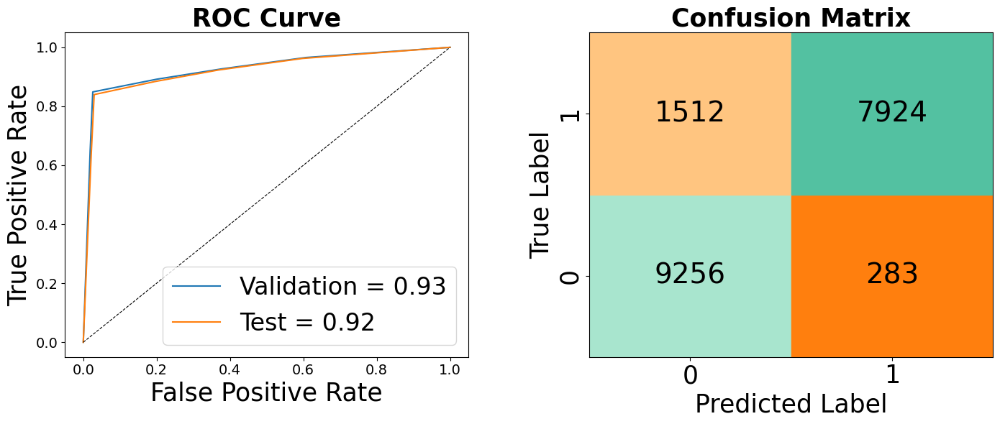


Validation Metrics:
Accuracy: 0.91, Precision: 0.97, Recall: 0.85, F1: 0.91, AUC: 0.93

Test Metrics:
Accuracy: 0.91, Precision: 0.97, Recall: 0.84, F1: 0.90, AUC: 0.92


In [31]:
# Initialize the Decision Tree model
dtree = DecisionTreeClassifier(random_state=42)

# Enhanced parameter grid for tuning
param_grid = {
    'max_depth': [3, 5, 10, 20, None],         # Depth of the tree
    'min_samples_split': [2, 5, 10, 20],      # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 5, 10],        # Minimum samples at a leaf node
    'criterion': ['gini', 'entropy'],         # Splitting criteria
    'splitter': ['best', 'random'],           # Splitting strategy
}


# Perform Grid Search with 5-fold cross-validation
grid_search = GridSearchCV(estimator=dtree, param_grid=param_grid, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Retrieve the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the best Decision Tree model
best_dtree = grid_search.best_estimator_

# Evaluate on the Validation Set
y_val_pred = best_dtree.predict(X_val)
y_val_proba = best_dtree.predict_proba(X_val)[:, 1]

# Validation Metrics
val_accuracy = accuracy_score(y_val, y_val_pred)
val_precision = precision_score(y_val, y_val_pred)
val_recall = recall_score(y_val, y_val_pred)
val_f1 = f1_score(y_val, y_val_pred)
val_auc = roc_auc_score(y_val, y_val_proba)

# Evaluate on the Test Set
y_test_pred = best_dtree.predict(X_test)
y_test_proba = best_dtree.predict_proba(X_test)[:, 1]

# Test Metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

# Confusion Matrix for Test Set
conf_matrix = confusion_matrix(y_test, y_test_pred)

# ROC Curve for Validation and Test Sets
val_fpr, val_tpr, _ = roc_curve(y_val, y_val_proba)
test_fpr, test_tpr, _ = roc_curve(y_test, y_test_proba)

# Create Subplots for ROC Curve and Confusion Matrix
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC Curve
axs[0].plot(val_fpr, val_tpr, label=f"Validation = {val_auc:.2f}")
axs[0].plot(test_fpr, test_tpr, label=f"Test = {test_auc:.2f}")
axs[0].plot([0, 1], [0, 1], 'k--', lw=0.8)
axs[0].set_title("ROC Curve", fontsize=25, fontweight='bold')
axs[0].set_xlabel("False Positive Rate", fontsize=25)
axs[0].set_ylabel("True Positive Rate", fontsize=25)
# axs[0].legend()
axs[0].legend(
    loc='lower right',                 # Change position
    bbox_to_anchor=(1.0, 0.0),         # Fine-tune position relative to the axes
    prop={'size': 24}
)
axs[0].tick_params(axis='both', labelsize=14)


# Plot Confusion Matrix with Custom Colors
# Define custom colors for TP, TN, FP, and FN
colors = {
    'TP': '#53c1a1',  # Green for True Positives
    'TN': '#a8e5ce',  # Light Green for True Negatives
    'FP': '#ff7f0e',  # Orange for False Positives
    'FN': '#ffc580'   # Light Orange for False Negatives
}

# Plot each cell of the confusion matrix with appropriate colors
n_rows, n_cols = conf_matrix.shape
for i in range(n_rows):
    for j in range(n_cols):
        value = conf_matrix[i, j]
        # Assign colors based on the cell meaning
        if i == j:  # Diagonal cells (TP, TN)
            color = colors['TP'] if i == 1 else colors['TN']
        else:  # Off-diagonal cells (FP, FN)
            color = colors['FP'] if j == 1 else colors['FN']
        # Draw the rectangle with the assigned color
        axs[1].add_patch(plt.Rectangle((j, i), 1, 1, color=color))
        # Add text in the center of the cell
        text_color = 'black' if value > conf_matrix.max() / 2 else 'black'
        axs[1].text(j + 0.5, i + 0.5, str(value), ha="center", va="center", color=text_color, fontsize=28)

# Configure Confusion Matrix axis labels and ticks
axs[1].set_xticks(np.arange(n_cols) + 0.5)
axs[1].set_yticks(np.arange(n_rows) + 0.5)
axs[1].set_xticklabels(['0', '1'], fontsize=25)
axs[1].set_yticklabels(['0', '1'], fontsize=25, rotation=90, verticalalignment='center')
axs[1].set_xlabel('Predicted Label', fontsize=25)
axs[1].set_ylabel('True Label', fontsize=25)

# Add title for Confusion Matrix
axs[1].set_title('Confusion Matrix', fontsize=25, fontweight='bold')
axs[1].set_xlim(0, n_cols)
axs[1].set_ylim(0, n_rows)
axs[1].grid(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()

# Print Metrics
print("\nValidation Metrics:")
print(f"Accuracy: {val_accuracy:.2f}, Precision: {val_precision:.2f}, Recall: {val_recall:.2f}, F1: {val_f1:.2f}, AUC: {val_auc:.2f}")
print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.2f}, Precision: {test_precision:.2f}, Recall: {test_recall:.2f}, F1: {test_f1:.2f}, AUC: {test_auc:.2f}")


### 7-3 Random Forest (RF)

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}


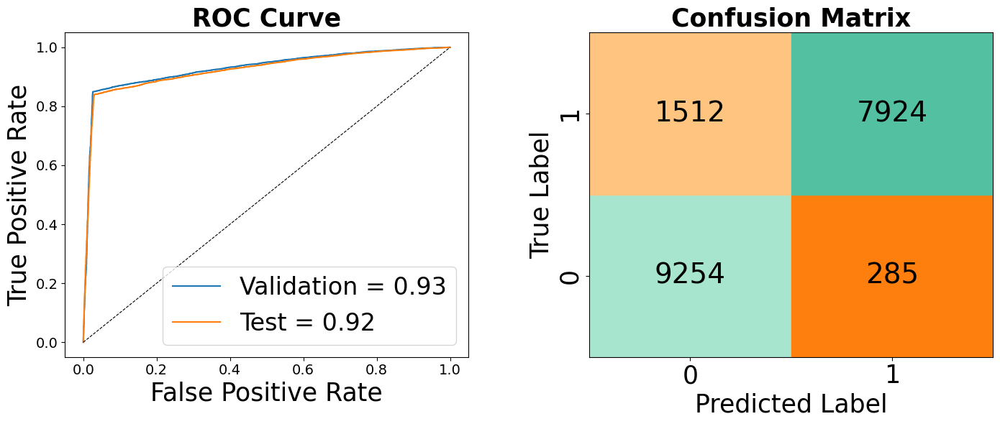


Validation Metrics:
Accuracy: 0.91, Precision: 0.97, Recall: 0.85, F1: 0.91, AUC: 0.93

Test Metrics:
Accuracy: 0.91, Precision: 0.97, Recall: 0.84, F1: 0.90, AUC: 0.92


In [32]:
# Step 2: Initialize the Random Forest model
rf = RandomForestClassifier(random_state=42)

# Step 3: Enhanced Hyperparameter Tuning using GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],        # Number of trees
    'max_depth': [10, 20, None],               # Depth of the trees
    'min_samples_split': [2, 5, 10],           # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 5],             # Minimum samples at a leaf node
    'criterion': ['gini', 'entropy'],          # Splitting criteria
}


grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='f1', cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Step 4: Train the best Random Forest model
best_rf = grid_search.best_estimator_

# Evaluate on the Validation Set
y_val_pred = best_rf.predict(X_val)
y_val_proba = best_rf.predict_proba(X_val)[:, 1]

# Validation Metrics
val_accuracy = accuracy_score(y_val, y_val_pred)
val_precision = precision_score(y_val, y_val_pred)
val_recall = recall_score(y_val, y_val_pred)
val_f1 = f1_score(y_val, y_val_pred)
val_auc = roc_auc_score(y_val, y_val_proba)

# Evaluate on the Test Set
y_test_pred = best_rf.predict(X_test)
y_test_proba = best_rf.predict_proba(X_test)[:, 1]

# Test Metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

# Confusion Matrix for Test Set
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Step 5: ROC Curve for Validation and Test Sets
val_fpr, val_tpr, _ = roc_curve(y_val, y_val_proba)
test_fpr, test_tpr, _ = roc_curve(y_test, y_test_proba)

# Create Subplots for ROC Curve and Confusion Matrix
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC Curve
axs[0].plot(val_fpr, val_tpr, label=f"Validation = {val_auc:.2f}")
axs[0].plot(test_fpr, test_tpr, label=f"Test = {test_auc:.2f}")
axs[0].plot([0, 1], [0, 1], 'k--', lw=0.8)
axs[0].set_title("ROC Curve", fontsize=25, fontweight='bold')
axs[0].set_xlabel("False Positive Rate", fontsize=25)
axs[0].set_ylabel("True Positive Rate", fontsize=25)
# axs[0].legend()
axs[0].legend(
    loc='lower right',                 # Change position
    bbox_to_anchor=(1.0, 0.0),         # Fine-tune position relative to the axes
    prop={'size': 24}
)
axs[0].tick_params(axis='both', labelsize=14)


# Plot Confusion Matrix with Custom Colors
# Define custom colors for TP, TN, FP, and FN
colors = {
    'TP': '#53c1a1',  # Green for True Positives
    'TN': '#a8e5ce',  # Light Green for True Negatives
    'FP': '#ff7f0e',  # Orange for False Positives
    'FN': '#ffc580'   # Light Orange for False Negatives
}

# Plot each cell of the confusion matrix with appropriate colors
n_rows, n_cols = conf_matrix.shape
for i in range(n_rows):
    for j in range(n_cols):
        value = conf_matrix[i, j]
        # Assign colors based on the cell meaning
        if i == j:  # Diagonal cells (TP, TN)
            color = colors['TP'] if i == 1 else colors['TN']
        else:  # Off-diagonal cells (FP, FN)
            color = colors['FP'] if j == 1 else colors['FN']
        # Draw the rectangle with the assigned color
        axs[1].add_patch(plt.Rectangle((j, i), 1, 1, color=color))
        # Add text in the center of the cell
        text_color = 'black' if value > conf_matrix.max() / 2 else 'black'
        axs[1].text(j + 0.5, i + 0.5, str(value), ha="center", va="center", color=text_color, fontsize=28)

# Configure Confusion Matrix axis labels and ticks
axs[1].set_xticks(np.arange(n_cols) + 0.5)
axs[1].set_yticks(np.arange(n_rows) + 0.5)
axs[1].set_xticklabels(['0', '1'], fontsize=25)
axs[1].set_yticklabels(['0', '1'], fontsize=25, rotation=90, verticalalignment='center')
axs[1].set_xlabel('Predicted Label', fontsize=25)
axs[1].set_ylabel('True Label', fontsize=25)

# Add title for Confusion Matrix
axs[1].set_title('Confusion Matrix', fontsize=25, fontweight='bold')
axs[1].set_xlim(0, n_cols)
axs[1].set_ylim(0, n_rows)
axs[1].grid(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()

# Print Metrics
print("\nValidation Metrics:")
print(f"Accuracy: {val_accuracy:.2f}, Precision: {val_precision:.2f}, Recall: {val_recall:.2f}, F1: {val_f1:.2f}, AUC: {val_auc:.2f}")
print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.2f}, Precision: {test_precision:.2f}, Recall: {test_recall:.2f}, F1: {test_f1:.2f}, AUC: {test_auc:.2f}")


#### 7-4 XGboost

Best Hyperparameters for XGBoost: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200}


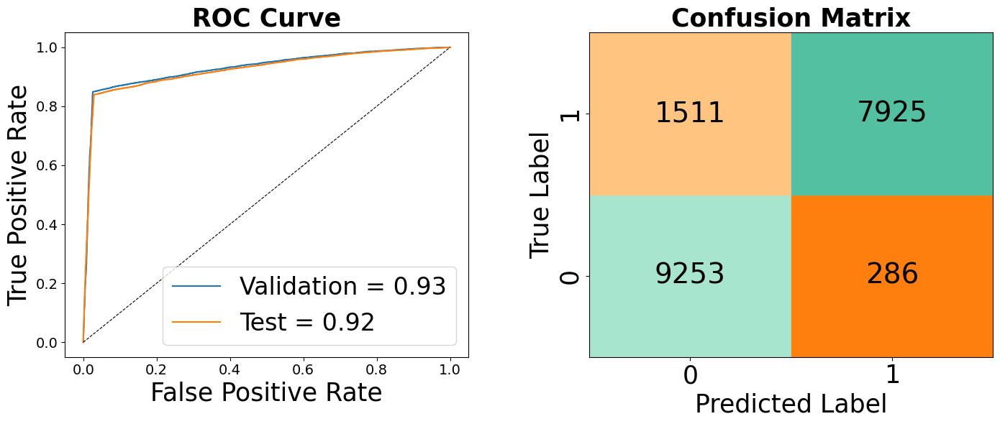


Validation Metrics:
Accuracy: 0.91, Precision: 0.97, Recall: 0.85, F1: 0.91, AUC: 0.93

Test Metrics:
Accuracy: 0.91, Precision: 0.97, Recall: 0.84, F1: 0.90, AUC: 0.92


In [33]:
# Initialize and tune the XGBoost model using GridSearchCV
xgb_param_grid = {
    'n_estimators': [50, 100, 200],       # Number of trees
    'max_depth': [3, 5, 10],                  # Maximum depth of a tree
    'learning_rate': [0.01, 0.1, 0.2],   # Boosting learning rate
}


xgb_grid_search = GridSearchCV(
    estimator=XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    param_grid=xgb_param_grid,
    scoring='f1',
    cv=5,
    n_jobs=-1
)
xgb_grid_search.fit(X_train, y_train)

# Best XGBoost model
best_xgb = xgb_grid_search.best_estimator_
best_params = xgb_grid_search.best_params_
print("Best Hyperparameters for XGBoost:", best_params)

# Metrics on Validation Set
y_val_pred_xgb = best_xgb.predict(X_val)
y_val_proba_xgb = best_xgb.predict_proba(X_val)[:, 1]

val_accuracy_xgb = accuracy_score(y_val, y_val_pred_xgb)
val_precision_xgb = precision_score(y_val, y_val_pred_xgb)
val_recall_xgb = recall_score(y_val, y_val_pred_xgb)
val_f1_xgb = f1_score(y_val, y_val_pred_xgb)
val_auc_xgb = roc_auc_score(y_val, y_val_proba_xgb)

# Metrics on Test Set
y_test_pred_xgb = best_xgb.predict(X_test)
y_test_proba_xgb = best_xgb.predict_proba(X_test)[:, 1]

test_accuracy_xgb = accuracy_score(y_test, y_test_pred_xgb)
test_precision_xgb = precision_score(y_test, y_test_pred_xgb)
test_recall_xgb = recall_score(y_test, y_test_pred_xgb)
test_f1_xgb = f1_score(y_test, y_test_pred_xgb)
test_auc_xgb = roc_auc_score(y_test, y_test_proba_xgb)

# Confusion Matrix for Test Set
conf_matrix = confusion_matrix(y_test, y_test_pred_xgb)

# ROC Curve
val_fpr_xgb, val_tpr_xgb, _ = roc_curve(y_val, y_val_proba_xgb)
test_fpr_xgb, test_tpr_xgb, _ = roc_curve(y_test, y_test_proba_xgb)

# Create Subplots for ROC Curve and Confusion Matrix
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC Curve
axs[0].plot(val_fpr, val_tpr, label=f"Validation = {val_auc:.2f}")
axs[0].plot(test_fpr, test_tpr, label=f"Test = {test_auc:.2f}")
axs[0].plot([0, 1], [0, 1], 'k--', lw=0.8)
axs[0].set_title("ROC Curve", fontsize=25, fontweight='bold')
axs[0].set_xlabel("False Positive Rate", fontsize=25)
axs[0].set_ylabel("True Positive Rate", fontsize=25)
# axs[0].legend()
axs[0].legend(
    loc='lower right',                 # Change position
    bbox_to_anchor=(1.0, 0.0),         # Fine-tune position relative to the axes
    prop={'size': 24}
)
axs[0].tick_params(axis='both', labelsize=14)


# Plot Confusion Matrix with Custom Colors
# Define custom colors for TP, TN, FP, and FN
colors = {
    'TP': '#53c1a1',  # Green for True Positives
    'TN': '#a8e5ce',  # Light Green for True Negatives
    'FP': '#ff7f0e',  # Orange for False Positives
    'FN': '#ffc580'   # Light Orange for False Negatives
}

# Plot each cell of the confusion matrix with appropriate colors
n_rows, n_cols = conf_matrix.shape
for i in range(n_rows):
    for j in range(n_cols):
        value = conf_matrix[i, j]
        # Assign colors based on the cell meaning
        if i == j:  # Diagonal cells (TP, TN)
            color = colors['TP'] if i == 1 else colors['TN']
        else:  # Off-diagonal cells (FP, FN)
            color = colors['FP'] if j == 1 else colors['FN']
        # Draw the rectangle with the assigned color
        axs[1].add_patch(plt.Rectangle((j, i), 1, 1, color=color))
        # Add text in the center of the cell
        text_color = 'black' if value > conf_matrix.max() / 2 else 'black'
        axs[1].text(j + 0.5, i + 0.5, str(value), ha="center", va="center", color=text_color, fontsize=28)

# Configure Confusion Matrix axis labels and ticks
axs[1].set_xticks(np.arange(n_cols) + 0.5)
axs[1].set_yticks(np.arange(n_rows) + 0.5)
axs[1].set_xticklabels(['0', '1'], fontsize=25)
axs[1].set_yticklabels(['0', '1'], fontsize=25, rotation=90, verticalalignment='center')
axs[1].set_xlabel('Predicted Label', fontsize=25)
axs[1].set_ylabel('True Label', fontsize=25)

# Add title for Confusion Matrix
axs[1].set_title('Confusion Matrix', fontsize=25, fontweight='bold')
axs[1].set_xlim(0, n_cols)
axs[1].set_ylim(0, n_rows)
axs[1].grid(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()

# Print Metrics
print("\nValidation Metrics:")
print(f"Accuracy: {val_accuracy:.2f}, Precision: {val_precision:.2f}, Recall: {val_recall:.2f}, F1: {val_f1:.2f}, AUC: {val_auc:.2f}")
print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.2f}, Precision: {test_precision:.2f}, Recall: {test_recall:.2f}, F1: {test_f1:.2f}, AUC: {test_auc:.2f}")


### 7-5 Multi Layer Perceptron

Best Hyperparameters: {'batch_size': 64, 'epochs': 15, 'model__activation': 'tanh', 'model__dropout_rate': 0, 'model__hidden_layers': (16, 32, 16), 'model__learning_rate': 0.001}


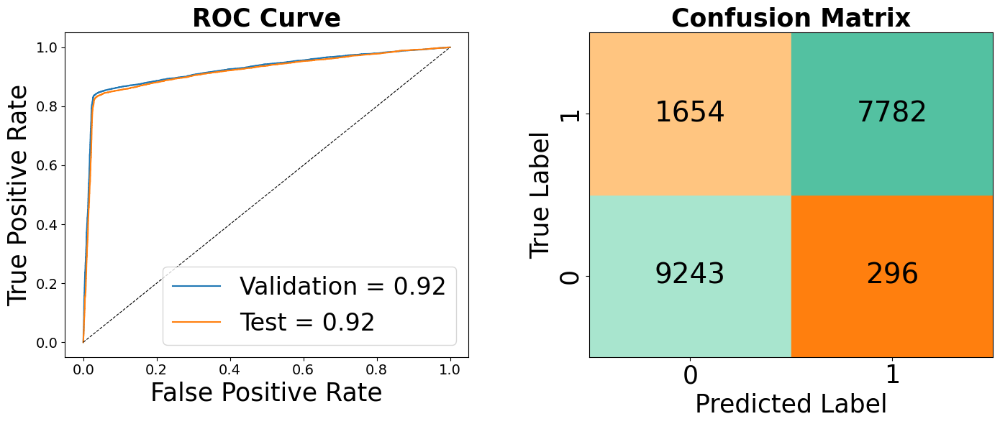


Validation Metrics:
Accuracy: 0.90, Precision: 0.97, Recall: 0.83, F1: 0.89, AUC: 0.92

Test Metrics:
Accuracy: 0.90, Precision: 0.96, Recall: 0.82, F1: 0.89, AUC: 0.92


In [36]:
from scikeras.wrappers import KerasClassifier  # Use scikeras instead of tensorflow.keras.wrappers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Define the MLP model
def create_mlp(hidden_layers=(32,), activation='relu', learning_rate=0.001, dropout_rate=0.2):
    model = Sequential()
    model.add(Dense(hidden_layers[0], activation=activation, input_dim=X_train.shape[1]))
    model.add(Dropout(dropout_rate))
    
    for units in hidden_layers[1:]:
        model.add(Dense(units, activation=activation))
        model.add(Dropout(dropout_rate))
    
    model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Wrap the Keras model using scikeras' KerasClassifier
mlp = KerasClassifier(model=create_mlp, verbose=0)


# Hyperparameter tuning grid
param_grid = {
    "model__hidden_layers": [(8, 16, 8) , (16,32,16)],  
    "model__learning_rate": [0.001 , 0.01],
    "model__dropout_rate": [0 , 0.2],
    "model__activation": ['relu' , 'tanh'],
    "batch_size": [32 , 64],
    "epochs": [15]
}


grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid, scoring='f1', cv=3, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the best MLP model
best_mlp = grid_search.best_estimator_

# Evaluate on the Validation Set
y_val_pred = best_mlp.predict(X_val)
y_val_proba = best_mlp.predict_proba(X_val)[:, 1]

# Validation Metrics
val_accuracy = accuracy_score(y_val, y_val_pred)
val_precision = precision_score(y_val, y_val_pred)
val_recall = recall_score(y_val, y_val_pred)
val_f1 = f1_score(y_val, y_val_pred)
val_auc = roc_auc_score(y_val, y_val_proba)

# Evaluate on the Test Set
y_test_pred = best_mlp.predict(X_test)
y_test_proba = best_mlp.predict_proba(X_test)[:, 1]

# Test Metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

# Confusion Matrix for Test Set
conf_matrix = confusion_matrix(y_test, y_test_pred)

# ROC Curve for Validation and Test Sets
val_fpr, val_tpr, _ = roc_curve(y_val, y_val_proba)
test_fpr, test_tpr, _ = roc_curve(y_test, y_test_proba)

# Create Subplots for ROC Curve and Confusion Matrix
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC Curve
axs[0].plot(val_fpr, val_tpr, label=f"Validation = {val_auc:.2f}")
axs[0].plot(test_fpr, test_tpr, label=f"Test = {test_auc:.2f}")
axs[0].plot([0, 1], [0, 1], 'k--', lw=0.8)
axs[0].set_title("ROC Curve", fontsize=25, fontweight='bold')
axs[0].set_xlabel("False Positive Rate", fontsize=25)
axs[0].set_ylabel("True Positive Rate", fontsize=25)
# axs[0].legend()
axs[0].legend(
    loc='lower right',                 # Change position
    bbox_to_anchor=(1.0, 0.0),         # Fine-tune position relative to the axes
    prop={'size': 24}
)
axs[0].tick_params(axis='both', labelsize=14)


# Plot Confusion Matrix with Custom Colors
# Define custom colors for TP, TN, FP, and FN
colors = {
    'TP': '#53c1a1',  # Green for True Positives
    'TN': '#a8e5ce',  # Light Green for True Negatives
    'FP': '#ff7f0e',  # Orange for False Positives
    'FN': '#ffc580'   # Light Orange for False Negatives
}

# Plot each cell of the confusion matrix with appropriate colors
n_rows, n_cols = conf_matrix.shape
for i in range(n_rows):
    for j in range(n_cols):
        value = conf_matrix[i, j]
        # Assign colors based on the cell meaning
        if i == j:  # Diagonal cells (TP, TN)
            color = colors['TP'] if i == 1 else colors['TN']
        else:  # Off-diagonal cells (FP, FN)
            color = colors['FP'] if j == 1 else colors['FN']
        # Draw the rectangle with the assigned color
        axs[1].add_patch(plt.Rectangle((j, i), 1, 1, color=color))
        # Add text in the center of the cell
        text_color = 'black' if value > conf_matrix.max() / 2 else 'black'
        axs[1].text(j + 0.5, i + 0.5, str(value), ha="center", va="center", color=text_color, fontsize=28)

# Configure Confusion Matrix axis labels and ticks
axs[1].set_xticks(np.arange(n_cols) + 0.5)
axs[1].set_yticks(np.arange(n_rows) + 0.5)
axs[1].set_xticklabels(['0', '1'], fontsize=25)
axs[1].set_yticklabels(['0', '1'], fontsize=25, rotation=90, verticalalignment='center')
axs[1].set_xlabel('Predicted Label', fontsize=25)
axs[1].set_ylabel('True Label', fontsize=25)

# Add title for Confusion Matrix
axs[1].set_title('Confusion Matrix', fontsize=25, fontweight='bold')
axs[1].set_xlim(0, n_cols)
axs[1].set_ylim(0, n_rows)
axs[1].grid(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()

# Print Metrics
print("\nValidation Metrics:")
print(f"Accuracy: {val_accuracy:.2f}, Precision: {val_precision:.2f}, Recall: {val_recall:.2f}, F1: {val_f1:.2f}, AUC: {val_auc:.2f}")
print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.2f}, Precision: {test_precision:.2f}, Recall: {test_recall:.2f}, F1: {test_f1:.2f}, AUC: {test_auc:.2f}")


### 7-6 RNN

Best Hyperparameters: {'batch_size': 32, 'epochs': 15, 'model__activation': 'tanh', 'model__dropout_rate': 0, 'model__hidden_units': 32, 'model__learning_rate': 0.001, 'model__optimizer': 'adam'}


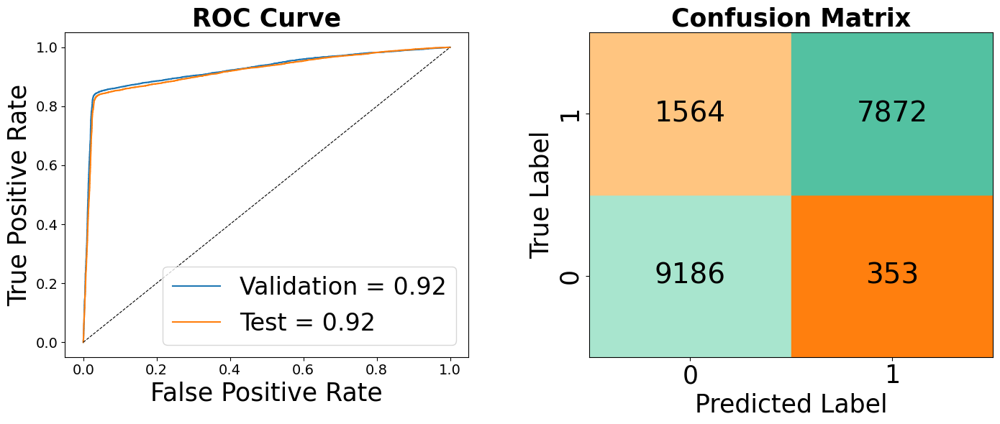


Validation Metrics:
Accuracy: 0.90, Precision: 0.96, Recall: 0.84, F1: 0.90, AUC: 0.92

Test Metrics:
Accuracy: 0.90, Precision: 0.96, Recall: 0.83, F1: 0.89, AUC: 0.92


In [38]:
X_train = X_train.to_numpy().reshape((X_train.shape[0], 1, X_train.shape[1]))
X_val = X_val.to_numpy().reshape((X_val.shape[0], 1, X_val.shape[1]))
X_test = X_test.to_numpy().reshape((X_test.shape[0], 1, X_test.shape[1]))


# Define the RNN model
def create_rnn(hidden_units=32, activation='tanh', learning_rate=0.001, dropout_rate=0.2, optimizer='adam'):
    model = Sequential()
    model.add(SimpleRNN(hidden_units, activation=activation, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))  # Output layer for binary classification

    # Select optimizer
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        opt = SGD(learning_rate=learning_rate)

    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Wrap the Keras model using scikeras' KerasClassifier
rnn = KerasClassifier(model=create_rnn, verbose=0)

# Hyperparameter tuning grid
param_grid = {
    "model__hidden_units": [16, 32],
    "model__activation": ['tanh', 'relu'],
    "model__learning_rate": [0.001, 0.01],
    "model__dropout_rate": [0 , 0.2],
    "batch_size": [32, 64],
    "epochs": [15],
    "model__optimizer": ['adam', 'rmsprop', 'sgd'], 

}

grid_search = GridSearchCV(estimator=rnn, param_grid=param_grid, scoring='f1', cv=3, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the best RNN model
best_rnn = grid_search.best_estimator_

# Evaluate on the Validation Set
y_val_pred = best_rnn.predict(X_val)
y_val_proba = best_rnn.predict_proba(X_val)[:, 1]

# Validation Metrics
val_accuracy = accuracy_score(y_val, y_val_pred)
val_precision = precision_score(y_val, y_val_pred)
val_recall = recall_score(y_val, y_val_pred)
val_f1 = f1_score(y_val, y_val_pred)
val_auc = roc_auc_score(y_val, y_val_proba)

# Evaluate on the Test Set
y_test_pred = best_rnn.predict(X_test)
y_test_proba = best_rnn.predict_proba(X_test)[:, 1]

# Test Metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

# Confusion Matrix for Test Set
conf_matrix = confusion_matrix(y_test, y_test_pred)

# ROC Curve for Validation and Test Sets
val_fpr, val_tpr, _ = roc_curve(y_val, y_val_proba)
test_fpr, test_tpr, _ = roc_curve(y_test, y_test_proba)

# Create Subplots for ROC Curve and Confusion Matrix
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC Curve
axs[0].plot(val_fpr, val_tpr, label=f"Validation = {val_auc:.2f}")
axs[0].plot(test_fpr, test_tpr, label=f"Test = {test_auc:.2f}")
axs[0].plot([0, 1], [0, 1], 'k--', lw=0.8)
axs[0].set_title("ROC Curve", fontsize=25, fontweight='bold')
axs[0].set_xlabel("False Positive Rate", fontsize=25)
axs[0].set_ylabel("True Positive Rate", fontsize=25)
# axs[0].legend()
axs[0].legend(
    loc='lower right',                 # Change position
    bbox_to_anchor=(1.0, 0.0),         # Fine-tune position relative to the axes
    prop={'size': 24}
)
axs[0].tick_params(axis='both', labelsize=14)


# Plot Confusion Matrix with Custom Colors
# Define custom colors for TP, TN, FP, and FN
colors = {
    'TP': '#53c1a1',  # Green for True Positives
    'TN': '#a8e5ce',  # Light Green for True Negatives
    'FP': '#ff7f0e',  # Orange for False Positives
    'FN': '#ffc580'   # Light Orange for False Negatives
}

# Plot each cell of the confusion matrix with appropriate colors
n_rows, n_cols = conf_matrix.shape
for i in range(n_rows):
    for j in range(n_cols):
        value = conf_matrix[i, j]
        # Assign colors based on the cell meaning
        if i == j:  # Diagonal cells (TP, TN)
            color = colors['TP'] if i == 1 else colors['TN']
        else:  # Off-diagonal cells (FP, FN)
            color = colors['FP'] if j == 1 else colors['FN']
        # Draw the rectangle with the assigned color
        axs[1].add_patch(plt.Rectangle((j, i), 1, 1, color=color))
        # Add text in the center of the cell
        text_color = 'black' if value > conf_matrix.max() / 2 else 'black'
        axs[1].text(j + 0.5, i + 0.5, str(value), ha="center", va="center", color=text_color, fontsize=28)

# Configure Confusion Matrix axis labels and ticks
axs[1].set_xticks(np.arange(n_cols) + 0.5)
axs[1].set_yticks(np.arange(n_rows) + 0.5)
axs[1].set_xticklabels(['0', '1'], fontsize=25)
axs[1].set_yticklabels(['0', '1'], fontsize=25, rotation=90, verticalalignment='center')
axs[1].set_xlabel('Predicted Label', fontsize=25)
axs[1].set_ylabel('True Label', fontsize=25)

# Add title for Confusion Matrix
axs[1].set_title('Confusion Matrix', fontsize=25, fontweight='bold')
axs[1].set_xlim(0, n_cols)
axs[1].set_ylim(0, n_rows)
axs[1].grid(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()

# Print Metrics
print("\nValidation Metrics:")
print(f"Accuracy: {val_accuracy:.2f}, Precision: {val_precision:.2f}, Recall: {val_recall:.2f}, F1: {val_f1:.2f}, AUC: {val_auc:.2f}")
print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.2f}, Precision: {test_precision:.2f}, Recall: {test_recall:.2f}, F1: {test_f1:.2f}, AUC: {test_auc:.2f}")


### 7-7 Tabnet


epoch 0  | loss: 0.33407 | val_auc: 0.92549 |  0:00:05s
epoch 1  | loss: 0.30237 | val_auc: 0.92895 |  0:00:11s
epoch 2  | loss: 0.29992 | val_auc: 0.92985 |  0:00:18s
epoch 3  | loss: 0.29818 | val_auc: 0.92884 |  0:00:24s
epoch 4  | loss: 0.29403 | val_auc: 0.9303  |  0:00:31s
epoch 5  | loss: 0.29139 | val_auc: 0.92959 |  0:00:37s
epoch 6  | loss: 0.2912  | val_auc: 0.93015 |  0:00:43s
epoch 7  | loss: 0.28999 | val_auc: 0.92953 |  0:00:49s
epoch 8  | loss: 0.28922 | val_auc: 0.93022 |  0:00:55s
epoch 9  | loss: 0.28989 | val_auc: 0.92837 |  0:01:02s
epoch 10 | loss: 0.28952 | val_auc: 0.93069 |  0:01:08s
epoch 11 | loss: 0.28904 | val_auc: 0.93122 |  0:01:15s
epoch 12 | loss: 0.28947 | val_auc: 0.93154 |  0:01:21s
epoch 13 | loss: 0.28838 | val_auc: 0.93105 |  0:01:27s
epoch 14 | loss: 0.28775 | val_auc: 0.9318  |  0:01:33s
epoch 15 | loss: 0.28913 | val_auc: 0.93134 |  0:01:40s
epoch 16 | loss: 0.28899 | val_auc: 0.93091 |  0:01:46s
epoch 17 | loss: 0.28873 | val_auc: 0.93113 |  0

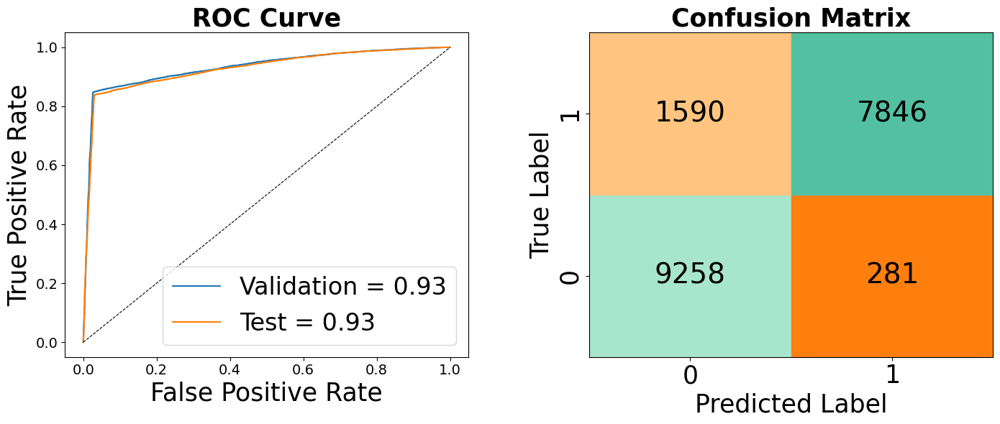


Validation Metrics:
Accuracy: 0.91, Precision: 0.97, Recall: 0.84, F1: 0.90, AUC: 0.93

Test Metrics:
Accuracy: 0.90, Precision: 0.97, Recall: 0.83, F1: 0.89, AUC: 0.93


In [37]:
# Split data into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Define the TabNet wrapper class
class TabNetWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, n_d=8, n_a=8, n_steps=3, gamma=1.3, lambda_sparse=1e-3):
        self.n_d = n_d
        self.n_a = n_a
        self.n_steps = n_steps
        self.gamma = gamma
        self.lambda_sparse = lambda_sparse
        self.model = None

    def fit(self, X, y):
        # Convert pandas DataFrame/Series to NumPy arrays
        X = X.values if isinstance(X, pd.DataFrame) else X
        y = y.values if isinstance(y, pd.Series) else y
        
        self.model = TabNetClassifier(
            n_d=self.n_d, n_a=self.n_a, n_steps=self.n_steps, gamma=self.gamma,
            lambda_sparse=self.lambda_sparse, optimizer_fn=torch.optim.Adam,
            optimizer_params=dict(lr=0.02), mask_type="entmax"
        )
        self.model.fit(
            X_train=X, y_train=y,
            eval_set=[(X_val.values, y_val.values)],
            eval_name=["val"],
            eval_metric=["auc"],
            max_epochs=50,
            patience=10,
            batch_size=256, virtual_batch_size=128,
            num_workers=0,
            drop_last=False
        )
        return self

    def predict(self, X):
        X = X.values if isinstance(X, pd.DataFrame) else X
        return self.model.predict(X)

    def predict_proba(self, X):
        X = X.values if isinstance(X, pd.DataFrame) else X
        return self.model.predict_proba(X)

    def get_params(self, deep=True):
        return {
            "n_d": self.n_d,
            "n_a": self.n_a,
            "n_steps": self.n_steps,
            "gamma": self.gamma,
            "lambda_sparse": self.lambda_sparse,
        }

    def set_params(self, **params):
        for param, value in params.items():
            setattr(self, param, value)
        return self

# Define hyperparameter grid
param_grid = {
    "n_d": [8, 16],
    "n_a": [8, 16],
    "n_steps": [3, 5],
    "gamma": [1.0, 1.3],
}

# Use GridSearchCV
grid_search = GridSearchCV(estimator=TabNetWrapper(), param_grid=param_grid, scoring="f1", cv=3, n_jobs=-1)

# Fit the model
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the best TabNet model
best_tabnet = grid_search.best_estimator_

# Evaluate on the Validation Set
y_val_pred = best_tabnet.predict(X_val)
y_val_proba = best_tabnet.predict_proba(X_val)[:, 1]

# Validation Metrics
val_accuracy = accuracy_score(y_val, y_val_pred)
val_precision = precision_score(y_val, y_val_pred)
val_recall = recall_score(y_val, y_val_pred)
val_f1 = f1_score(y_val, y_val_pred)
val_auc = roc_auc_score(y_val, y_val_proba)

# Evaluate on the Test Set
y_test_pred = best_tabnet.predict(X_test)
y_test_proba = best_tabnet.predict_proba(X_test)[:, 1]

# Test Metrics
test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_auc = roc_auc_score(y_test, y_test_proba)

# Confusion Matrix for Test Set
conf_matrix = confusion_matrix(y_test, y_test_pred)

# ROC Curve for Validation and Test Sets
val_fpr, val_tpr, _ = roc_curve(y_val, y_val_proba)
test_fpr, test_tpr, _ = roc_curve(y_test, y_test_proba)

# Create Subplots for ROC Curve and Confusion Matrix
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC Curve
axs[0].plot(val_fpr, val_tpr, label=f"Validation = {val_auc:.2f}")
axs[0].plot(test_fpr, test_tpr, label=f"Test = {test_auc:.2f}")
axs[0].plot([0, 1], [0, 1], 'k--', lw=0.8)
axs[0].set_title("ROC Curve", fontsize=25, fontweight='bold')
axs[0].set_xlabel("False Positive Rate", fontsize=25)
axs[0].set_ylabel("True Positive Rate", fontsize=25)
# axs[0].legend()
axs[0].legend(
    loc='lower right',                 # Change position
    bbox_to_anchor=(1.0, 0.0),         # Fine-tune position relative to the axes
    prop={'size': 24}
)
axs[0].tick_params(axis='both', labelsize=14)


# Plot Confusion Matrix with Custom Colors
# Define custom colors for TP, TN, FP, and FN
colors = {
    'TP': '#53c1a1',  # Green for True Positives
    'TN': '#a8e5ce',  # Light Green for True Negatives
    'FP': '#ff7f0e',  # Orange for False Positives
    'FN': '#ffc580'   # Light Orange for False Negatives
}

# Plot each cell of the confusion matrix with appropriate colors
n_rows, n_cols = conf_matrix.shape
for i in range(n_rows):
    for j in range(n_cols):
        value = conf_matrix[i, j]
        # Assign colors based on the cell meaning
        if i == j:  # Diagonal cells (TP, TN)
            color = colors['TP'] if i == 1 else colors['TN']
        else:  # Off-diagonal cells (FP, FN)
            color = colors['FP'] if j == 1 else colors['FN']
        # Draw the rectangle with the assigned color
        axs[1].add_patch(plt.Rectangle((j, i), 1, 1, color=color))
        # Add text in the center of the cell
        text_color = 'black' if value > conf_matrix.max() / 2 else 'black'
        axs[1].text(j + 0.5, i + 0.5, str(value), ha="center", va="center", color=text_color, fontsize=28)

# Configure Confusion Matrix axis labels and ticks
axs[1].set_xticks(np.arange(n_cols) + 0.5)
axs[1].set_yticks(np.arange(n_rows) + 0.5)
axs[1].set_xticklabels(['0', '1'], fontsize=25)
axs[1].set_yticklabels(['0', '1'], fontsize=25, rotation=90, verticalalignment='center')
axs[1].set_xlabel('Predicted Label', fontsize=25)
axs[1].set_ylabel('True Label', fontsize=25)

# Add title for Confusion Matrix
axs[1].set_title('Confusion Matrix', fontsize=25, fontweight='bold')
axs[1].set_xlim(0, n_cols)
axs[1].set_ylim(0, n_rows)
axs[1].grid(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.3)
plt.show()

# Print Metrics
print("\nValidation Metrics:")
print(f"Accuracy: {val_accuracy:.2f}, Precision: {val_precision:.2f}, Recall: {val_recall:.2f}, F1: {val_f1:.2f}, AUC: {val_auc:.2f}")
print("\nTest Metrics:")
print(f"Accuracy: {test_accuracy:.2f}, Precision: {test_precision:.2f}, Recall: {test_recall:.2f}, F1: {test_f1:.2f}, AUC: {test_auc:.2f}")


# 8- Reporting the Results
#### We can use a bar plot to comapre the performance across 7 classifiers and report the results:

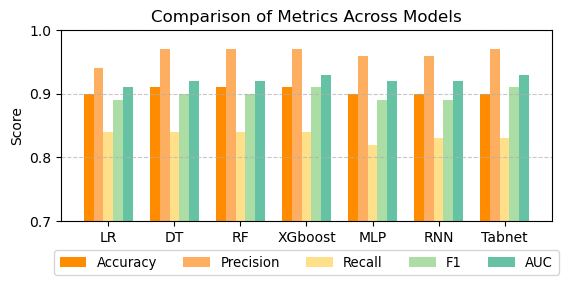

In [101]:
import numpy as np
import matplotlib.pyplot as plt

# Data
models = ['LR', 'DT', 'RF', 'XGboost', 'MLP', 'RNN', 'Tabnet']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC']
data = [
    [0.90, 0.94, 0.84, 0.89, 0.91],  # LR
    [0.91, 0.97, 0.84, 0.90, 0.92],  # DT
    [0.91, 0.97, 0.84, 0.90, 0.92],  # RF
    [0.91, 0.97, 0.84, 0.91, 0.93],  # XGboost
    [0.90, 0.96, 0.82, 0.89, 0.92],  # MLP
    [0.90, 0.96, 0.83, 0.89, 0.92],  # RNN
    [0.90, 0.97, 0.83, 0.91, 0.93]   # Tabnet
]

# Convert data into a NumPy array for easier plotting
data = np.array(data)

# Bar chart parameters
x = np.arange(len(models))  # the label locations
width = 0.15  # the width of the bars

# Define a gradient color palette between green and orange
gradient_colors = ['#FF8C00', '#fdae61', '#fee08b', '#abdda4', '#66c2a5']

# Create the figure and axis
fig, ax = plt.subplots(figsize=(6, 3))

# Plot each metric with the gradient colors
for i, (metric, color) in enumerate(zip(metrics, gradient_colors)):
    ax.bar(x + i * width, data[:, i], width, label=metric, color=color)

# Add labels, title, and legend
ax.set_ylabel('Score')
ax.set_title('Comparison of Metrics Across Models')
ax.set_xticks(x + width * 2)  # Adjust to align with groups
ax.set_xticklabels(models)
ax.set_ylim(0.7, 1)  # Adjust Y-axis to focus on the range

# Move the legend to a single row below the graph
ax.legend(
    loc='upper center',
    bbox_to_anchor=(0.5, -0.12),  # Position below the plot
    ncol=len(metrics),  # One row with all metrics
    fontsize=9.5
)

# Add gridlines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()


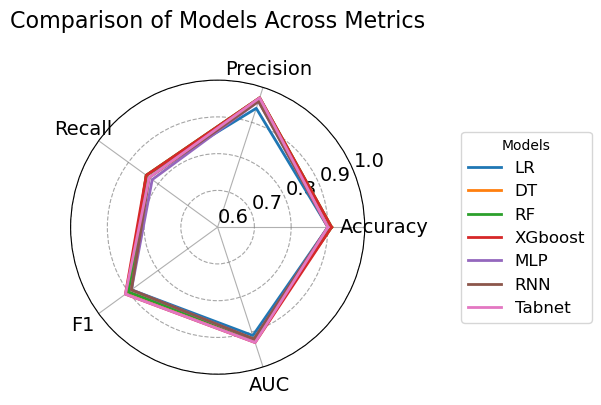

In [102]:
from math import pi
import matplotlib.pyplot as plt

# Models and Metrics
models = ['LR', 'DT', 'RF', 'XGboost', 'MLP', 'RNN', 'Tabnet']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC']
data = [
    [0.90, 0.94, 0.84, 0.89, 0.91],  # LR
    [0.91, 0.97, 0.84, 0.90, 0.92],  # DT
    [0.91, 0.97, 0.84, 0.90, 0.92],  # RF
    [0.91, 0.97, 0.84, 0.91, 0.93],  # XGboost
    [0.90, 0.96, 0.82, 0.89, 0.92],  # MLP
    [0.90, 0.96, 0.83, 0.89, 0.92],  # RNN
    [0.90, 0.97, 0.83, 0.91, 0.93]   # Tabnet
]

# Radar chart setup
num_vars = len(metrics)
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
angles += angles[:1]  # Close the radar chart loop

# Plot all models on the same radar chart
plt.figure(figsize=(6, 6))  # Adjust figure size
ax = plt.subplot(111, polar=True)

# Add metric labels as angles
plt.xticks(angles[:-1], metrics, fontsize=14)

# Add each model as an outline
for i, model in enumerate(models):
    values = data[i] + data[i][:1]  # Close the loop for each model
    ax.plot(angles, values, linewidth=2, label=model)  # Outline only (no fill)

# Customize radial gridlines
ax.set_ylim(0.6, 1.0)
ax.set_yticks([0.6, 0.7, 0.8, 0.9, 1.0])
ax.yaxis.grid(True, color='gray', linestyle='--', alpha=0.7)
ax.tick_params(axis='y', labelsize=14)  # Increase font size for radial tick numbers

# Add legend to the right middle of the plot
plt.legend(
    loc="center left",  # Place the legend at the center left relative to the plot
    bbox_to_anchor=(1.3, 0.5),  # Adjust position to the right middle
    fontsize=12,  # Adjust font size
    title="Models"
)

# Add title
plt.title("Comparison of Models Across Metrics", size=16, y=1.15 )

plt.tight_layout()
plt.show()


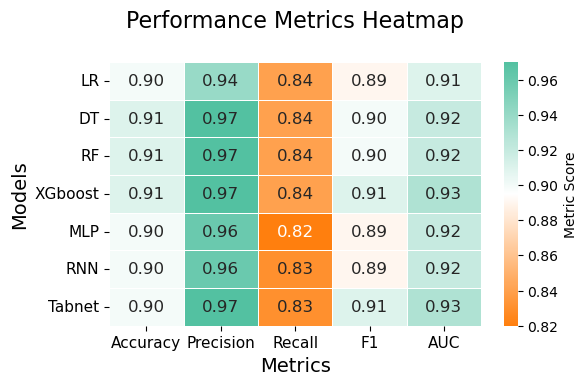

In [111]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Data
data = [
    [0.90, 0.94, 0.84, 0.89, 0.91],  # LR
    [0.91, 0.97, 0.84, 0.90, 0.92],  # DT
    [0.91, 0.97, 0.84, 0.90, 0.92],  # RF
    [0.91, 0.97, 0.84, 0.91, 0.93],  # XGboost
    [0.90, 0.96, 0.82, 0.89, 0.92],  # MLP
    [0.90, 0.96, 0.83, 0.89, 0.92],  # RNN
    [0.90, 0.97, 0.83, 0.91, 0.93]   # Tabnet
]
metrics = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC']
models = ['LR', 'DT', 'RF', 'XGboost', 'MLP', 'RNN', 'Tabnet']

# Create DataFrame for heatmap
df_heatmap = pd.DataFrame(data, columns=metrics, index=models)

# Custom colormap
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", ['#ff7f0e', 'white', '#53c1a1'])

# Heatmap with increased annotation font size
plt.figure(figsize=(6, 4))
sns.heatmap(
    df_heatmap,
    annot=True,
    fmt=".2f",
    cmap=custom_cmap,
    linewidths=0.5,
    cbar_kws={'label': 'Metric Score'},
    annot_kws={"fontsize": 12}  # Simplified font size adjustment
)
plt.title("Performance Metrics Heatmap", fontsize=16,  y=1.10)
plt.xlabel("Metrics", fontsize=14)
plt.ylabel("Models", fontsize=14, )
plt.yticks(rotation=0,  fontsize=11)
plt.xticks( fontsize=11)

plt.tight_layout()
plt.show()


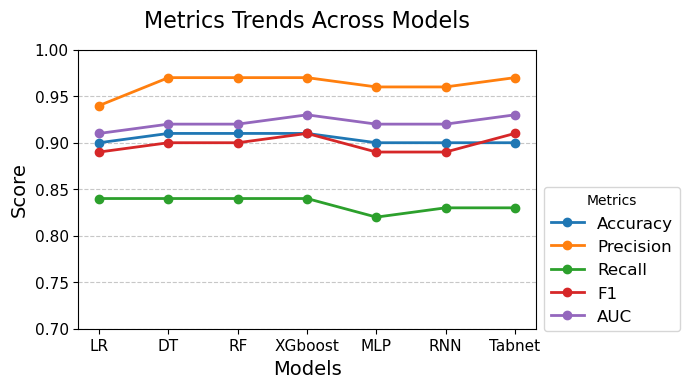

In [112]:
# Line Plot
plt.figure(figsize=(7, 4))

# Plot each metric as a separate line
for metric in metrics:
    plt.plot(models, df_heatmap[metric], marker="o", label=metric, linewidth=2)

# Add labels, title, and legend
plt.title("Metrics Trends Across Models", fontsize=16, y=1.05)
plt.xlabel("Models", fontsize=14)
plt.ylabel("Score", fontsize=14)
plt.ylim(0.7, 1.0)  # Set y-axis starting from 0.8
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

# Adjust legend to appear outside the chart
plt.legend(title="Metrics", fontsize=12, loc='center left', bbox_to_anchor=(1, 0.25), ncol=1)

# Add gridlines for better readability
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Ensure everything fits well
plt.tight_layout()
plt.show()


## 9-Statistical Comparison of Performance Metrics Over Time Intervals

In [98]:
import pandas as pd
from scipy.stats import friedmanchisquare, wilcoxon

# Sample DataFrame: Replace with actual data
data = {
    "Model": ["LR", "DT", "RF", "XGboost", "MLP", "RNN", "TabNet"],
    "F1_12M": [0.89, 0.9, 0.9, 0.9, 0.89, 0.89, 0.9],
    "F1_10M": [0.88, 0.89, 0.89, 0.89, 0.89, 0.89, 0.89],
    "F1_8M": [0.83, 0.84, 0.84, 0.84, 0.84, 0.83, 0.85],
    "F1_6M": [0.75, 0.76, 0.75, 0.76, 0.75, 0.75, 0.75],
    "AUC_12M": [0.91, 0.92, 0.92, 0.93, 0.92, 0.92, 0.93],
    "AUC_10M": [0.91, 0.92, 0.92, 0.92, 0.92, 0.92, 0.92],
    "AUC_8M": [0.87, 0.87, 0.87, 0.88, 0.88, 0.88, 0.88],
    "AUC_6M": [0.79, 0.78, 0.78, 0.79, 0.79, 0.79, 0.79],
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Prepare for statistical comparison for each time interval
time_intervals = ["6M", "8M", "10M", "12M"]
metrics = ["F1", "AUC"]

results = {}

for metric in metrics:
    metric_results = []
    for interval in time_intervals:
        values = df[f"{metric}_{interval}"]
        metric_results.append(values)
    
    # Perform Friedman Test for comparison across algorithms
    friedman_stat, friedman_p = friedmanchisquare(*metric_results)
    results[metric] = {"Friedman Test Stat": friedman_stat, "p-value": friedman_p}
    
    # Pairwise Wilcoxon test between time intervals (e.g., 6M vs 8M, etc.)
    pairwise_results = {}
    for i in range(len(time_intervals) - 1):
        for j in range(i + 1, len(time_intervals)):
            w_stat, w_p = wilcoxon(df[f"{metric}_{time_intervals[i]}"], df[f"{metric}_{time_intervals[j]}"])
            pairwise_results[f"{time_intervals[i]} vs {time_intervals[j]}"] = {"Wilcoxon Stat": w_stat, "p-value": w_p}
    results[metric]["Pairwise Wilcoxon"] = pairwise_results

# Display results
results


{'F1': {'Friedman Test Stat': 20.558823529411768,
  'p-value': 0.0001299900386369858,
  'Pairwise Wilcoxon': {'6M vs 8M': {'Wilcoxon Stat': 0.0,
    'p-value': 0.015625},
   '6M vs 10M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '6M vs 12M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '8M vs 10M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '8M vs 12M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '10M vs 12M': {'Wilcoxon Stat': 0.0, 'p-value': 0.0625}}},
 'AUC': {'Friedman Test Stat': 20.538461538461537,
  'p-value': 0.00013126073717899237,
  'Pairwise Wilcoxon': {'6M vs 8M': {'Wilcoxon Stat': 0.0,
    'p-value': 0.015625},
   '6M vs 10M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '6M vs 12M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '8M vs 10M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '8M vs 12M': {'Wilcoxon Stat': 0.0, 'p-value': 0.015625},
   '10M vs 12M': {'Wilcoxon Stat': 0.0, 'p-value': 0.5}}}}

# 10- Feature Importance and Model Explanation

epoch 0  | loss: 0.38355 | val_0_f1_score: 0.8589  |  0:00:03s
epoch 1  | loss: 0.3041  | val_0_f1_score: 0.87882 |  0:00:07s
epoch 2  | loss: 0.29866 | val_0_f1_score: 0.89654 |  0:00:10s
epoch 3  | loss: 0.30044 | val_0_f1_score: 0.90621 |  0:00:14s
epoch 4  | loss: 0.29714 | val_0_f1_score: 0.90623 |  0:00:17s
epoch 5  | loss: 0.29374 | val_0_f1_score: 0.91152 |  0:00:21s
epoch 6  | loss: 0.2899  | val_0_f1_score: 0.9112  |  0:00:25s
epoch 7  | loss: 0.28984 | val_0_f1_score: 0.91128 |  0:00:29s
epoch 8  | loss: 0.29005 | val_0_f1_score: 0.9058  |  0:00:36s
epoch 9  | loss: 0.28923 | val_0_f1_score: 0.91079 |  0:00:41s
epoch 10 | loss: 0.28947 | val_0_f1_score: 0.91119 |  0:00:45s
epoch 11 | loss: 0.28763 | val_0_f1_score: 0.90673 |  0:00:53s
epoch 12 | loss: 0.29019 | val_0_f1_score: 0.90548 |  0:00:59s
epoch 13 | loss: 0.28802 | val_0_f1_score: 0.91077 |  0:01:06s
epoch 14 | loss: 0.28887 | val_0_f1_score: 0.90767 |  0:01:12s
epoch 15 | loss: 0.28826 | val_0_f1_score: 0.90988 |  0

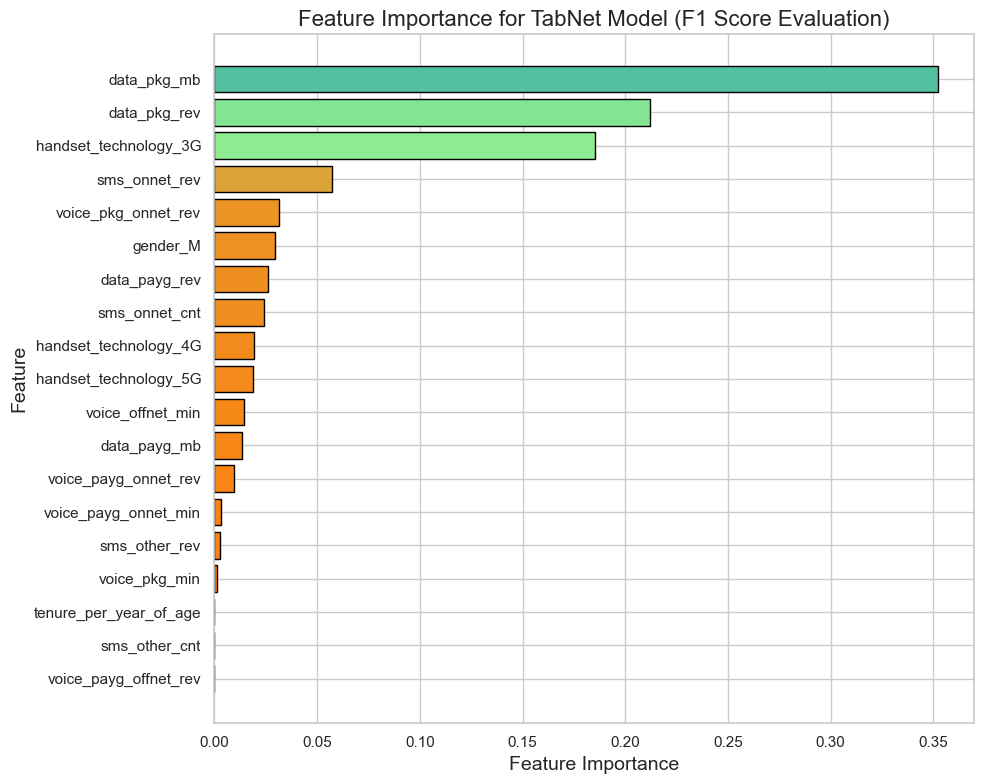

Best Epoch: 5
Best Validation F1 Score: 0.9115228579624662


In [140]:
from pytorch_tabnet.tab_model import TabNetClassifier
from pytorch_tabnet.metrics import Metric
from sklearn.metrics import f1_score
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Step 1: Define Custom F1 Metric
class F1Metric(Metric):
    def __init__(self):
        self._name = "f1_score"
        self._maximize = True  # Higher F1 score is better

    def __call__(self, y_true, y_pred):
        preds = np.argmax(y_pred, axis=1)  # Get predicted class labels
        return f1_score(y_true, preds, average="weighted")  # Weighted F1 Score

# Step 2: Train the TabNet Model with Best Hyperparameters
tabnet_model = TabNetClassifier(
    gamma=1.0,       # Hyperparameter from the best model
    n_a=8,           # Hyperparameter from the best model
    n_d=8,           # Hyperparameter from the best model
    n_steps=3,       # Hyperparameter from the best model
    seed=42,
    verbose=1
)

# Fit the model
tabnet_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric=[F1Metric],  # Using F1 score as evaluation metric
    patience=10,      # Early stopping patience
    max_epochs=50     # Cap on maximum epochs
)

# Step 3: Extract Feature Importance from the TabNet Model
tabnet_feature_importances = tabnet_model.feature_importances_

# Sort the feature importances and feature names
sorted_indices = np.argsort(tabnet_feature_importances)
sorted_feature_importances = tabnet_feature_importances[sorted_indices]
sorted_feature_names = [feature_names[i] for i in sorted_indices]  # Assuming `feature_names` is already defined

# Step 4: Create Gradient Color Map
cmap = LinearSegmentedColormap.from_list("custom_gradient", ['#ff7f0e', 'lightgreen', '#53c1a1'])
norm = plt.Normalize(vmin=min(sorted_feature_importances), vmax=max(sorted_feature_importances))
colors = [cmap(norm(value)) for value in sorted_feature_importances]

# Step 5: Plot Horizontal Bar Chart for Feature Importance
plt.figure(figsize=(10, 8))
bars = plt.barh(range(len(sorted_feature_importances)), sorted_feature_importances, color=colors, edgecolor="black")
plt.yticks(range(len(sorted_feature_importances)), sorted_feature_names)
plt.xlabel("Feature Importance", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.title("Feature Importance for TabNet Model (F1 Score Evaluation)", fontsize=16)
plt.tight_layout()
plt.show()

# Step 6: Print Important Metrics
print(f"Best Epoch: {tabnet_model.best_epoch}")
print(f"Best Validation F1 Score: {tabnet_model.best_cost}")
